In [2]:
%matplotlib inline

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import glob
from astropy.io import fits
from pathlib import Path
import bisect
import itertools
from scipy.stats import mode
from matplotlib.backends.backend_pdf import PdfPages

from funcs_v2 import get_z, get_SNR, get_dmean, get_meta
from spline_fit_v2 import spline_fit

def func(z):
    def func2(x):
        return x*(1+z)
    return func2

def inv(z):
    def inv2(x):
        return x/(1+z)
    return inv2

def closest(a, x):
    i = bisect.bisect_left(a, x)
    if i >= len(a):
        i = len(a) - 1
    elif i and a[i] - x > x - a[i - 1]:
        i = i - 1
    return (i, a[i])


In [4]:
VIS = '/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/VIS/'
NIR = '/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/NIR/'
PP = '/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/Post-Processed/'
ST = '/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/stitched/'


J215728.21-360215.1


/tmp/ipykernel_14952/4117157247.py:63: RuntimeWarning: divide by zero encountered in scalar divide
  sig_vis = np.array([np.sqrt(1/d[3]) for d in data_vis])
/tmp/ipykernel_14952/4117157247.py:69: RuntimeWarning: divide by zero encountered in scalar divide
  sig_nir = np.array([np.sqrt(1/d[3]) for d in data_nir])


1.7276824182814707


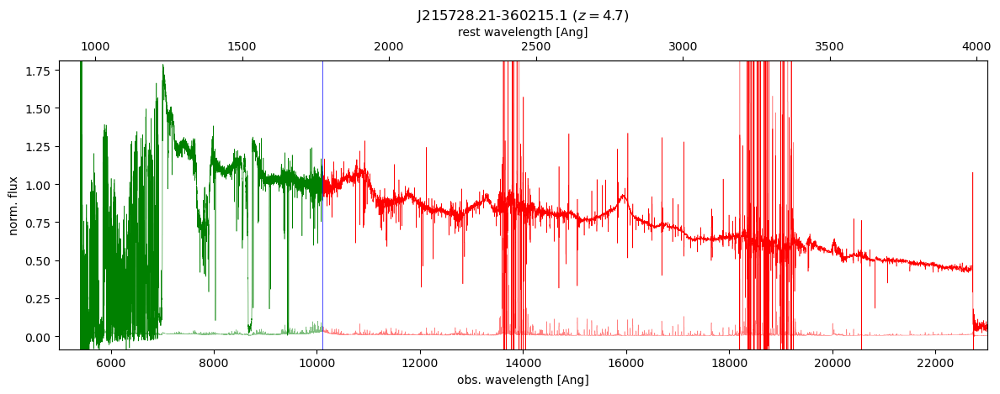

J111055-301130
2.4752115705967537


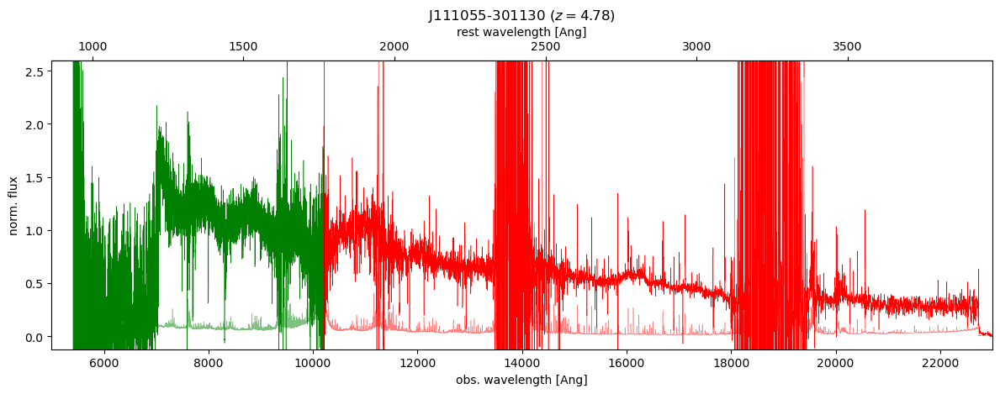

J091656-251146
2.9925086722192433


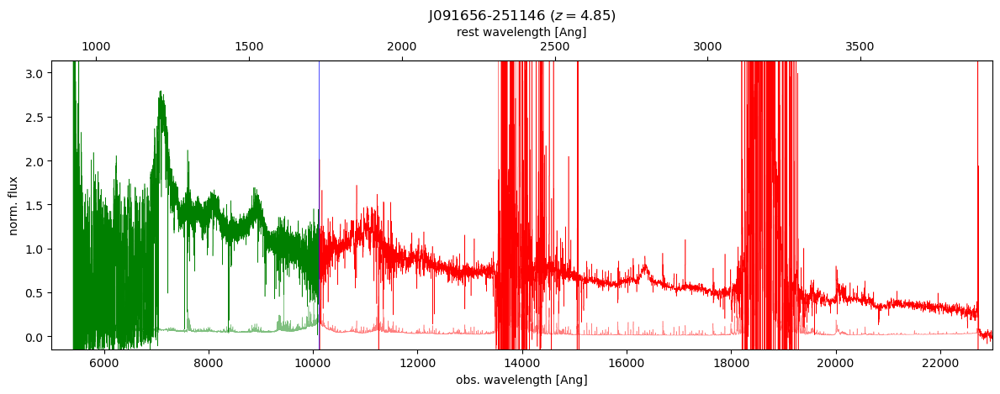

J222153-182603
J233505-590103
3.9859514925455097


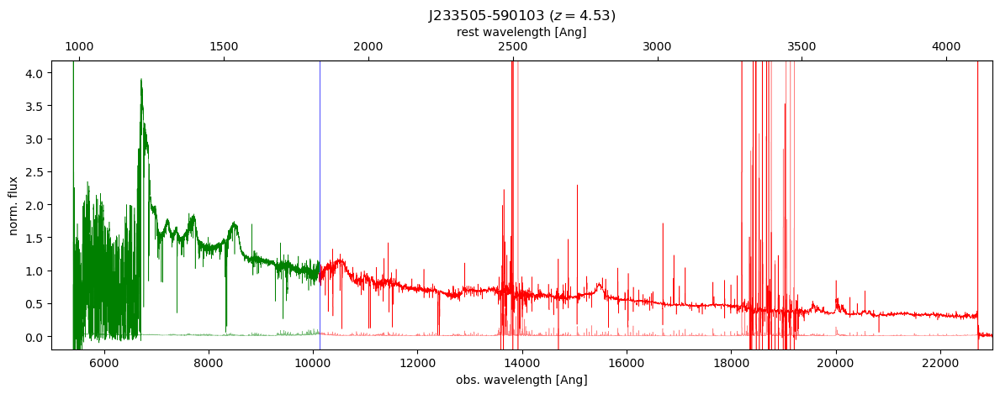

J211921-772253
3.655825524068923


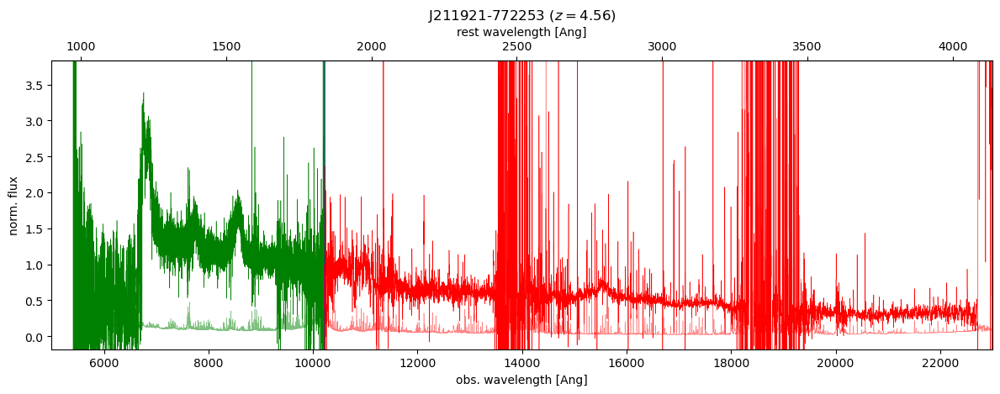

J001225-484830
4.751527439721135


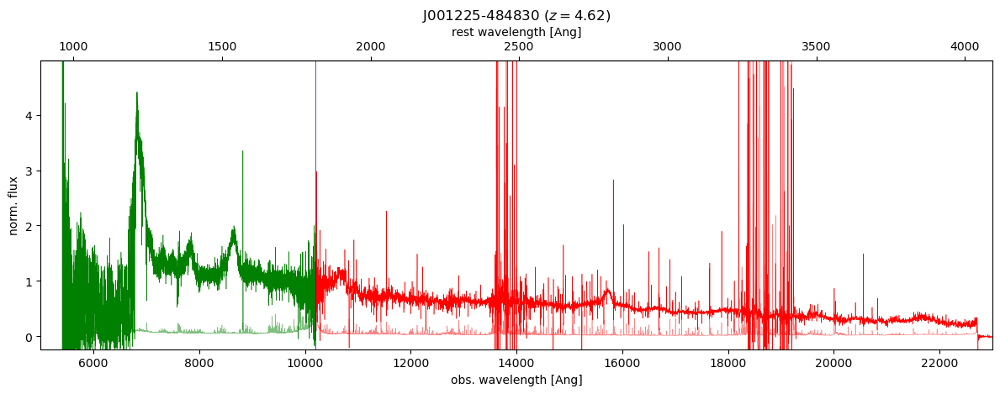

J230430-313427
J013539-212628
2.2411505323768575


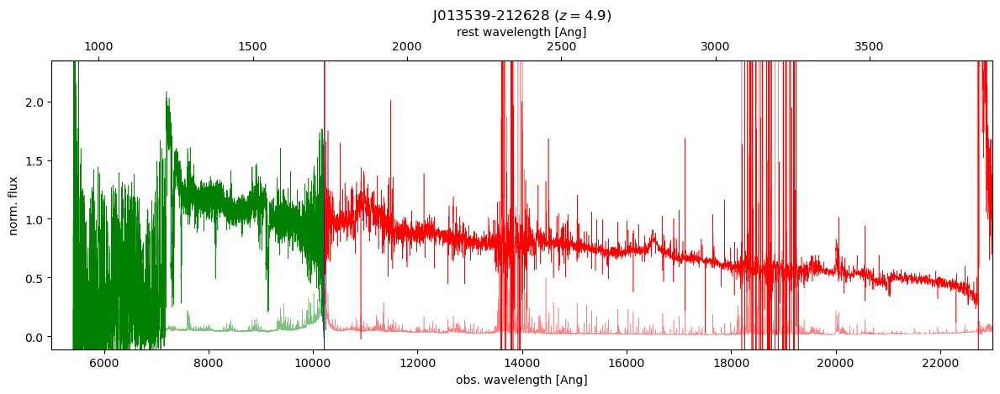

J230349-063343
2.4289346318946445


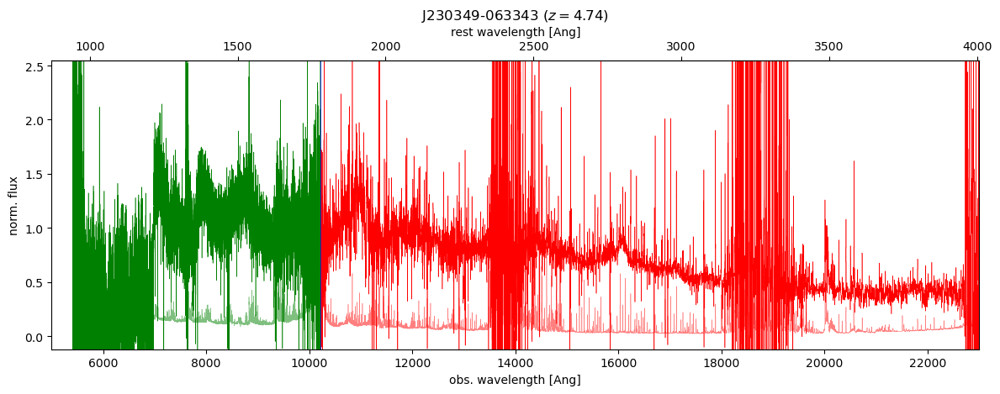

J151443-325024
13.948599743012185


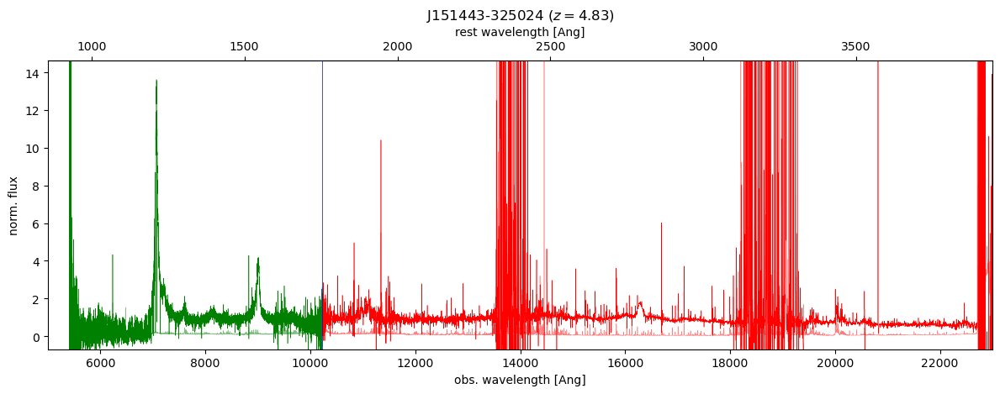

BR 1202-0725
2.5799485697938422


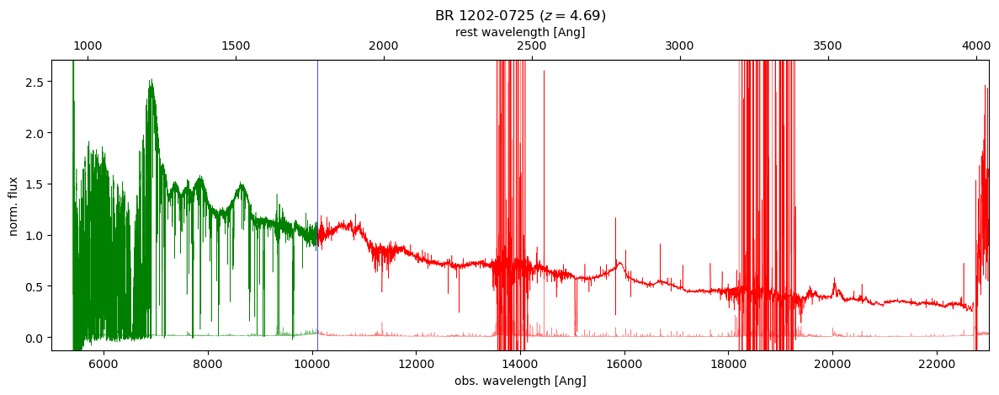

J211105-015604
4.298772130770806


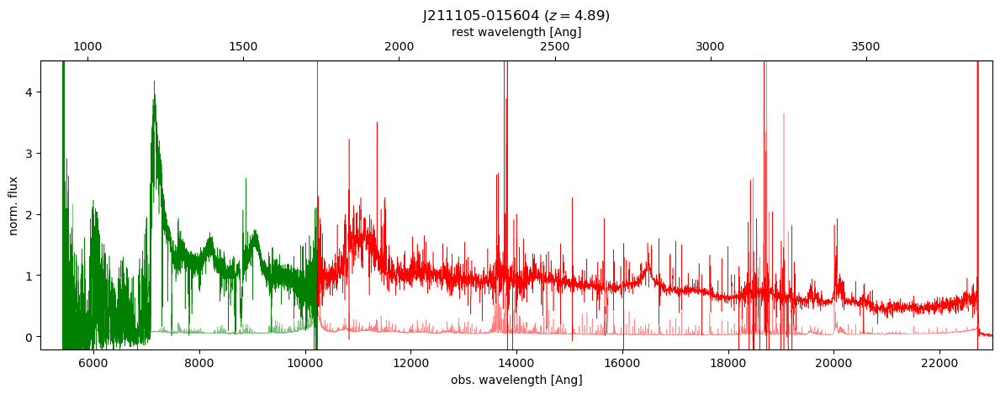

J014742-030248
J130031-282931
J072012-675632
SDSS J001115.23+144601.8
3.046760951598631


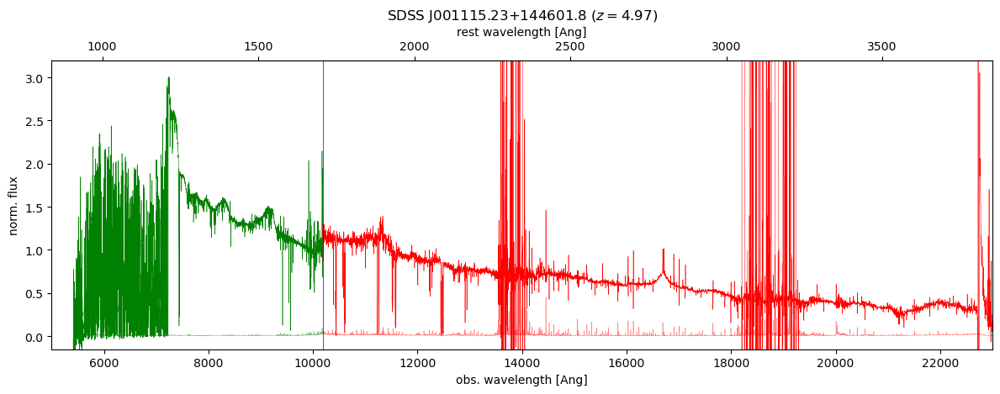

J220159-202627
2.4413067245464037


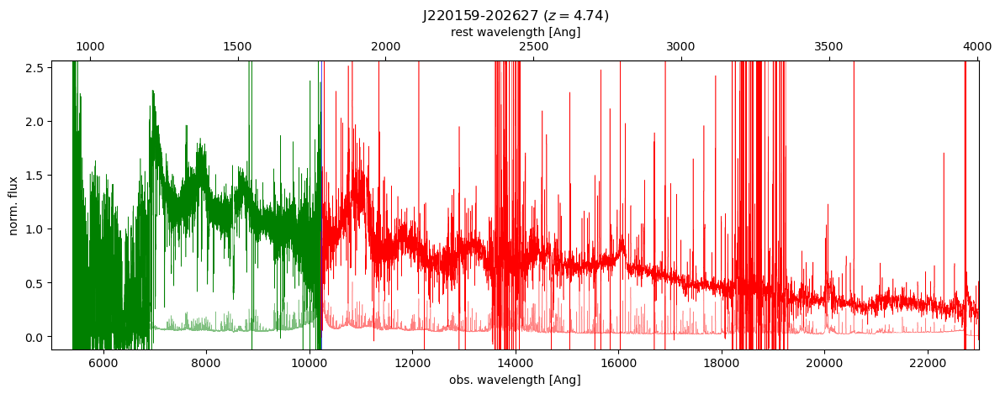

J113522-354839
3.635135606341403


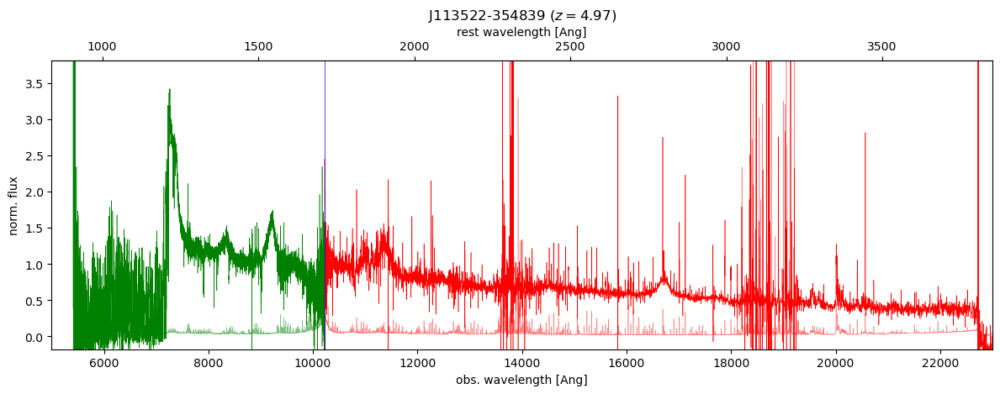

J093033-221208
J051509-431854
J020437-252315
14.413060521669808


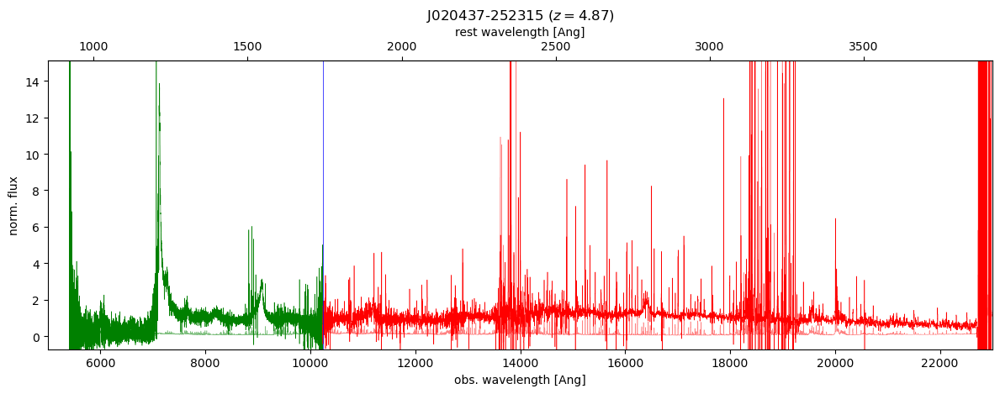

J111520-193506
2.8180778805224014


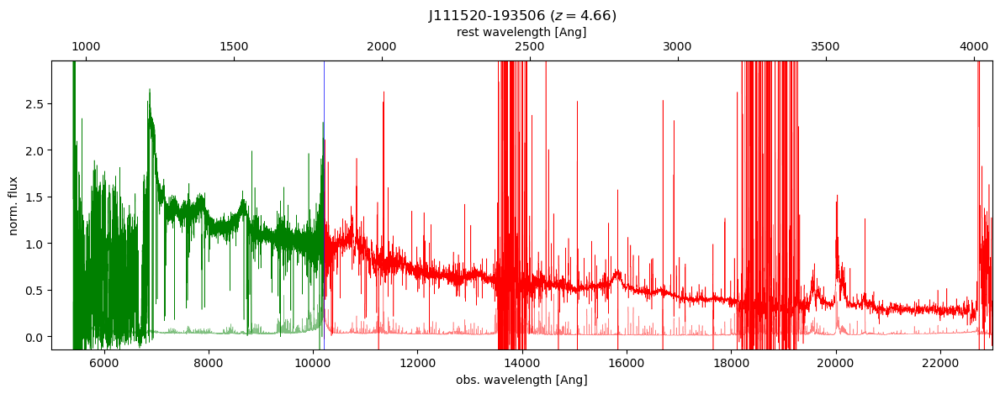

J121402-123548
J155657-172107
4.785624198027233


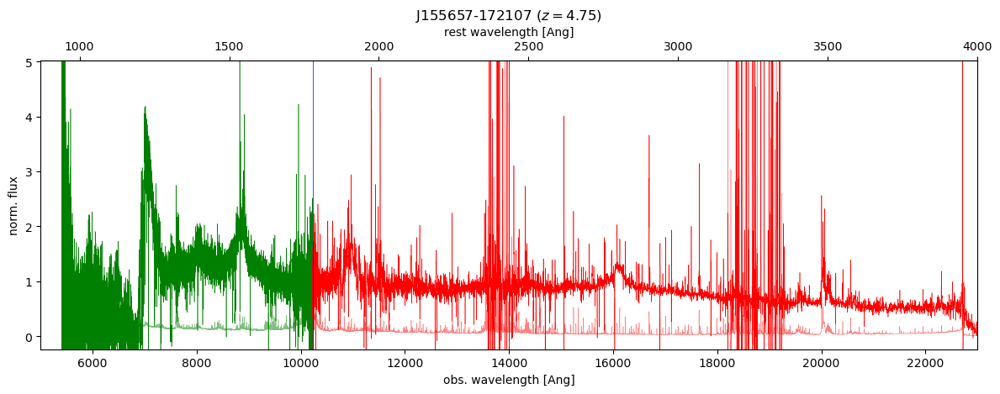

J045428-050049
J045057-265541
4.077438339322713


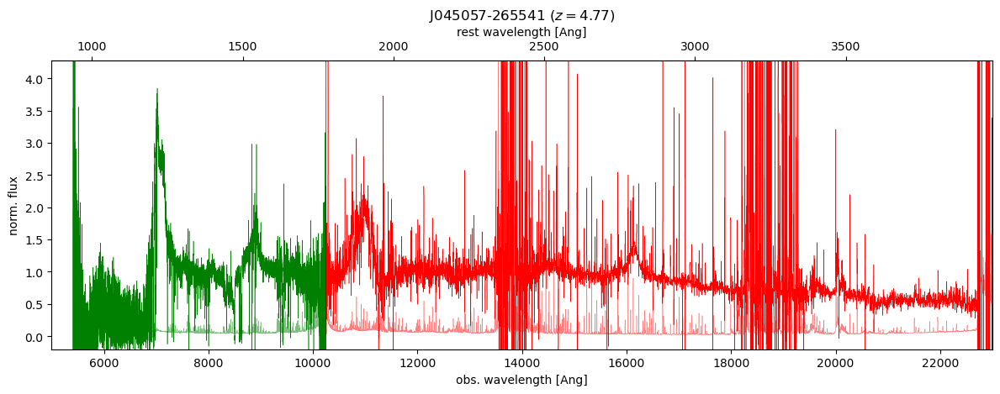

J040733-281031
11.334377024054092


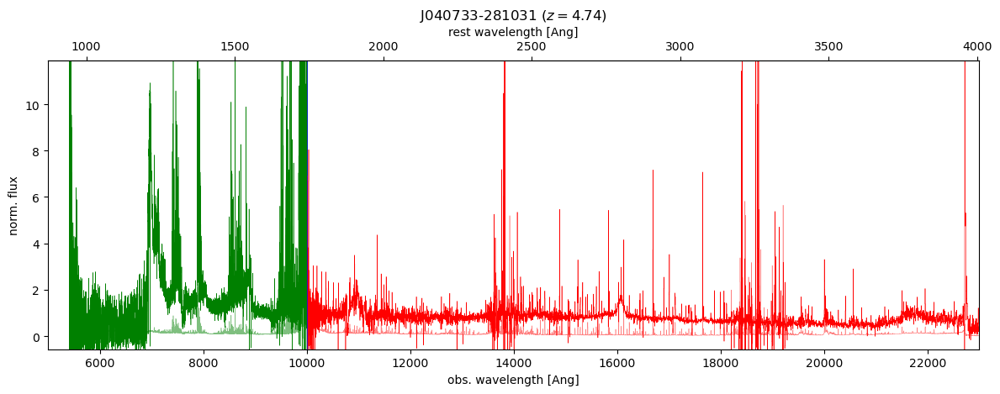

J022307-470902
4.090857044137254


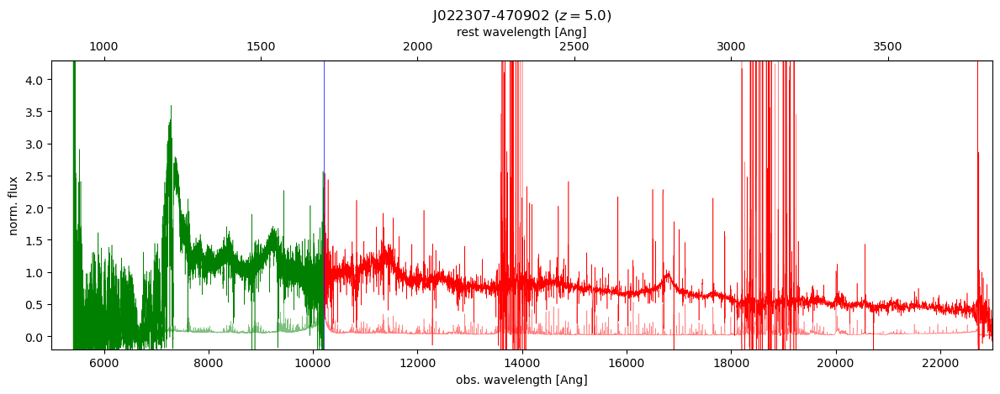

J232953-200039
2.7371746854445447


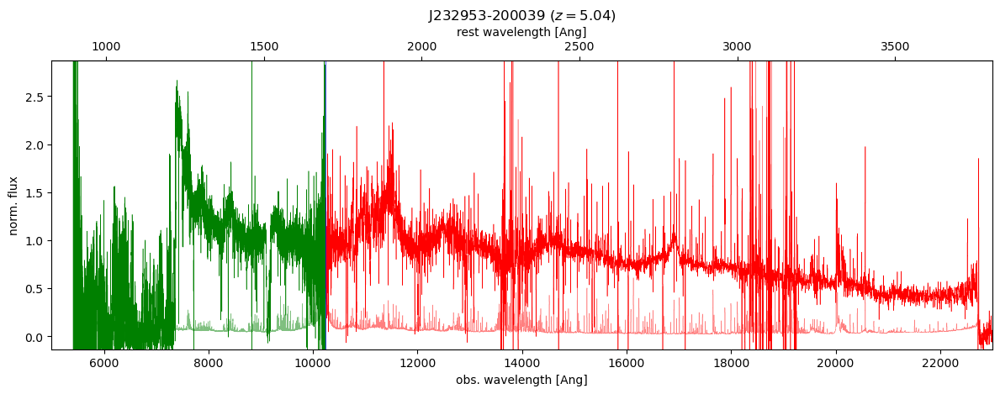

SDSS J002526.84-014532.5
6.196693751494463


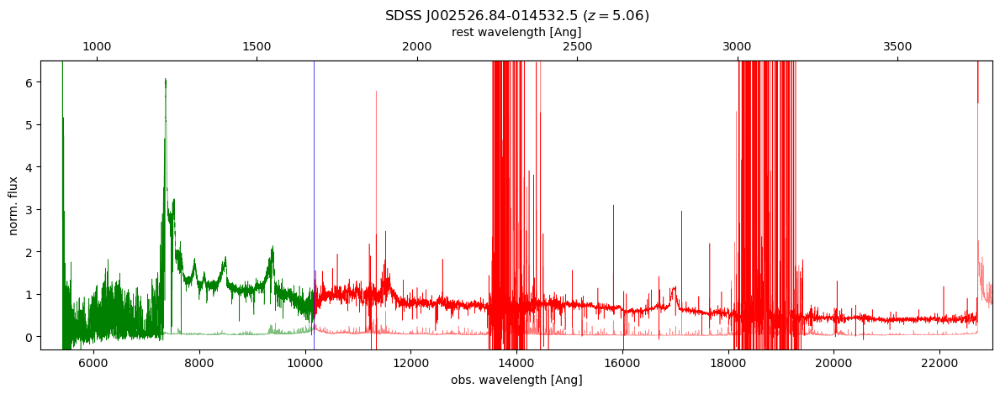

J033703-254832
5.699141632168128


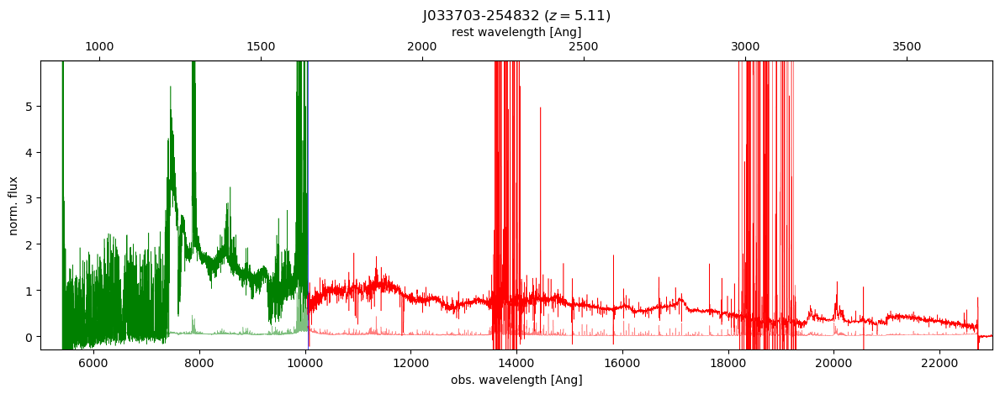

J214608-485819
2.93557834733089


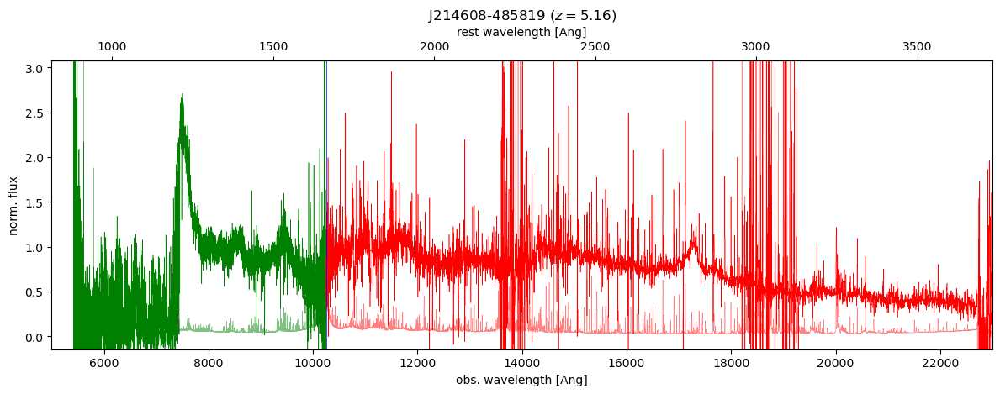

SDSS J095727.86+051905.2
3.9196718319259607


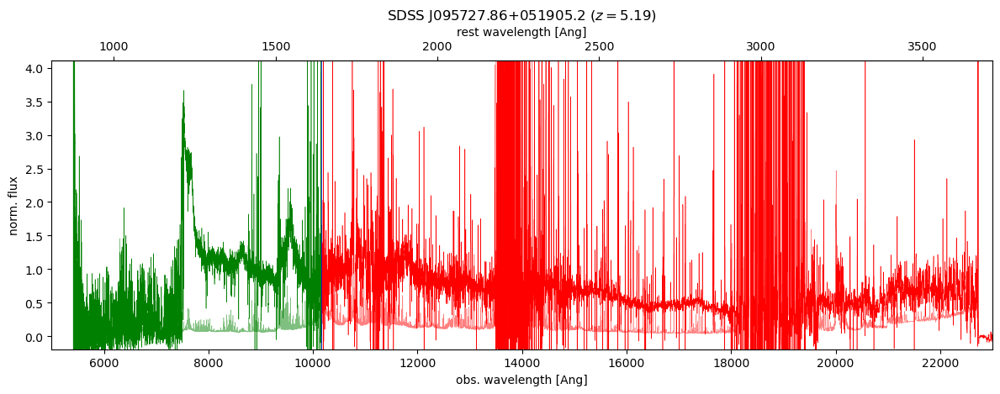

SDSS J013127.34-032100.1
3.5817321479124637


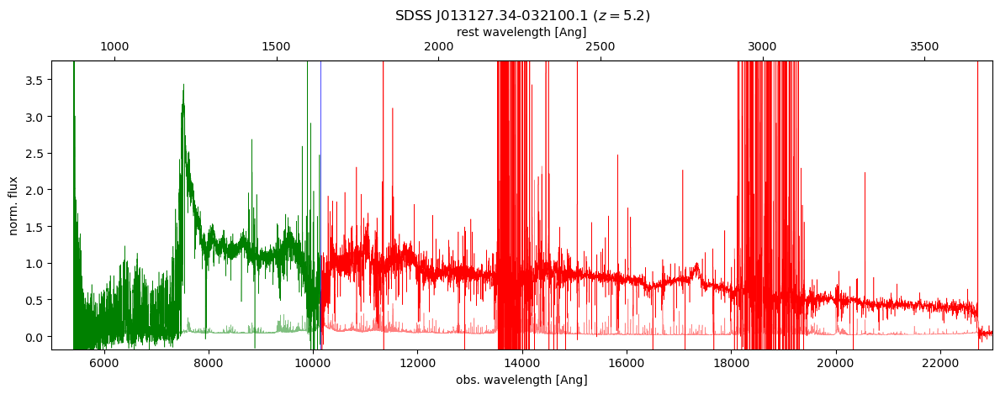

J023649-114734
2.9067507293338855


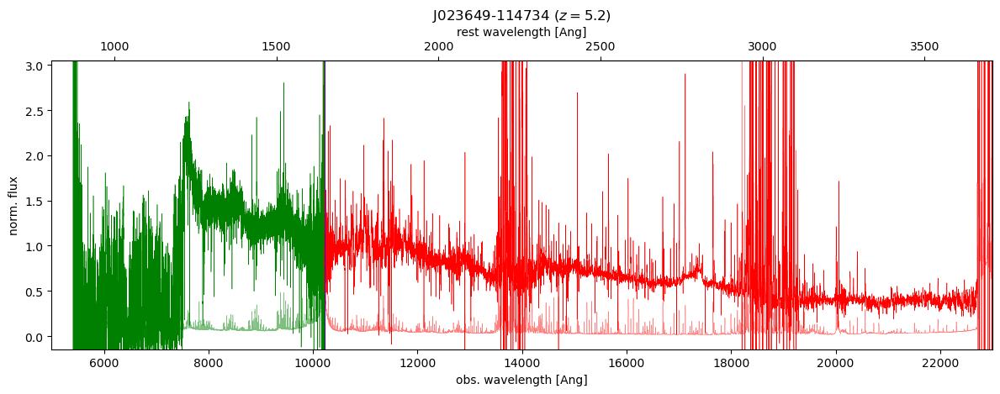

J162551.54-043049.4
J194124-450023
6.291514769274486


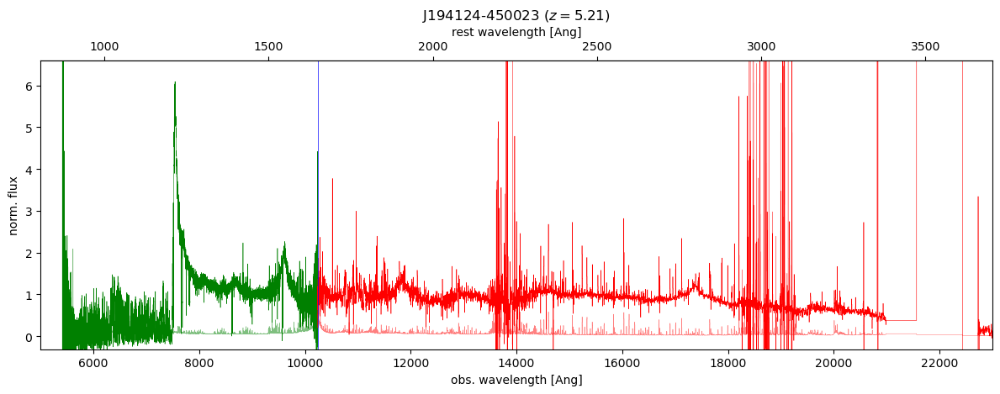

SDSS J074749.18+115352.4
4.534451614027214


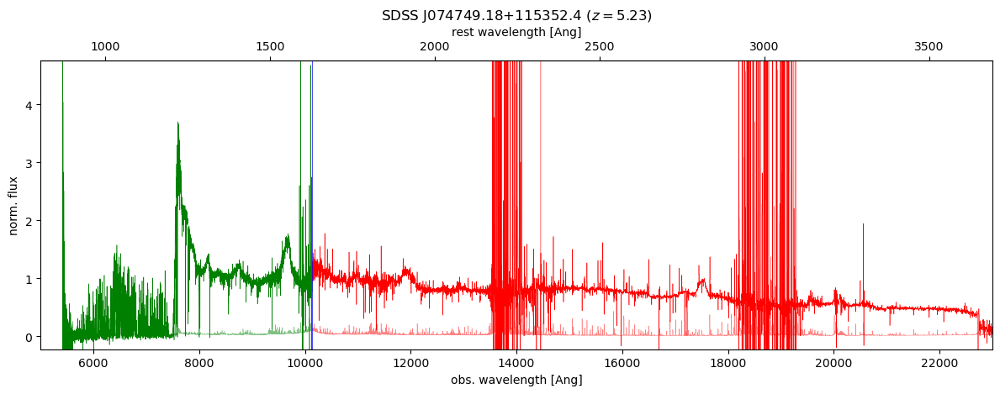

SDSS J222514.38+033012.5
2.536869377415005


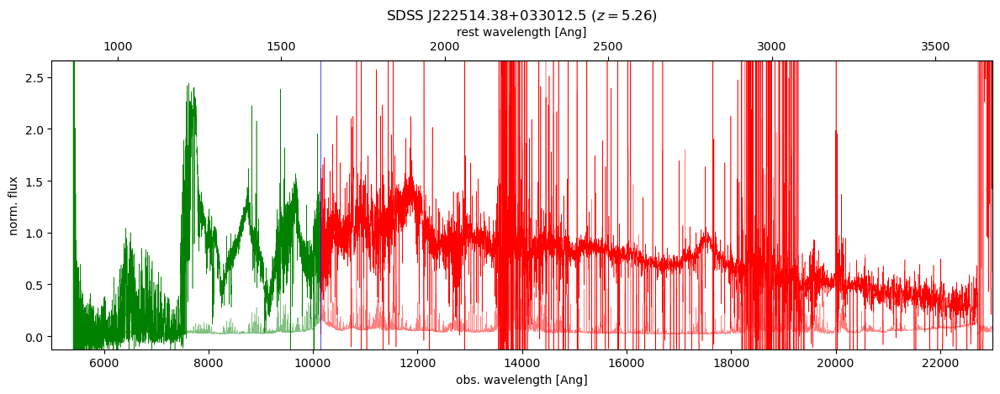

SDSS J220226.77+150952.3
3.3862298572117138


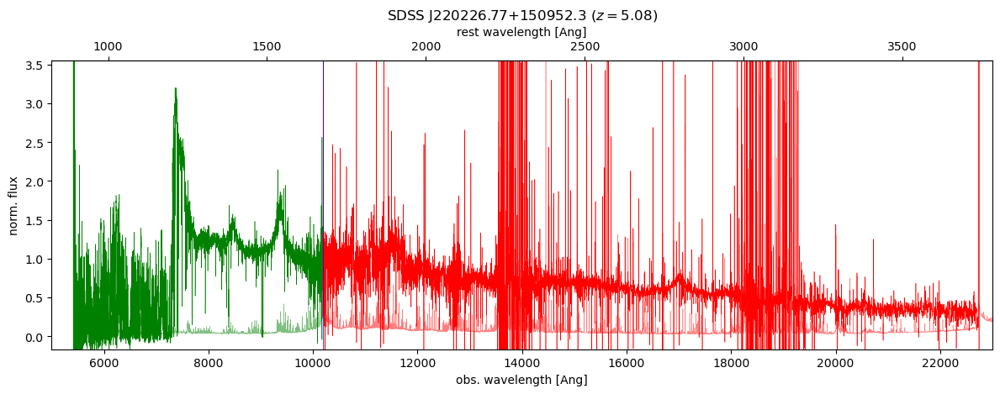

J222612-061807
5.471245472553121


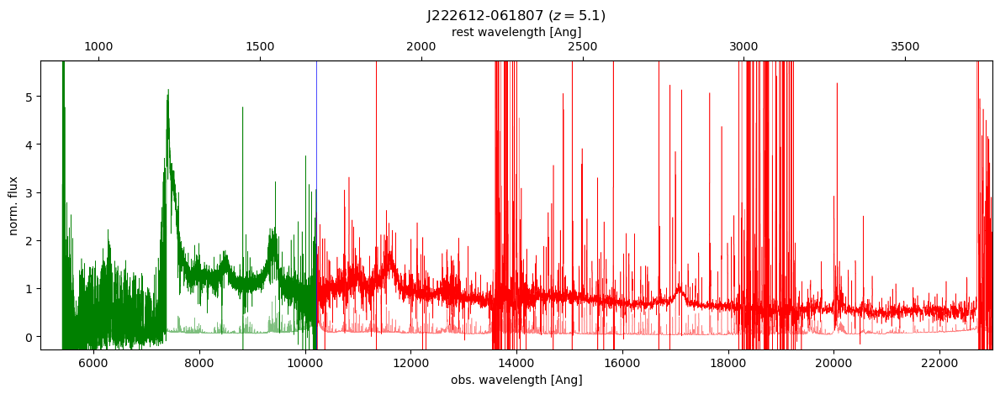

J140802-275820
J040915-275633


In [32]:
qmeta = np.loadtxt('/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/XQz5_meta.txt',delimiter = '\t',dtype='str')
qlist= qmeta[:,0] #['J215728.21-360215.1',
# 'J111055-301130',
# 'J091656-251146',
# 'J222153-182603',
# 'J233505-590103',
# 'J211921-772253',
# 'J001225-484830',
# 'J230430-313427',
# 'J013539-212628',
# 'J230349-063343',
# 'J151443-325024',
# 'BR 1202-0725',
# 'J211105-015604',
# 'J014742-030248',
# 'J130031-282931',
# 'J072012-675632',
# 'SDSS J001115.23+144601.8',
# 'J220159-202627',
# 'J113522-354839',
# 'J093033-221208',
# 'J051509-431854',
# 'J020437-252315',
# 'J111520-193506',
# 'J121402-123548',
# 'J155657-172107',
# 'J045428-050049',
# 'J045057-265541',
# 'J040733-281031',
# 'J022307-470902',
# 'J232953-200039',
# 'SDSS J002526.84-014532.5',
# 'J033703-254832',
# 'J214608-485819',
# 'SDSS J095727.86+051905.2',
# 'SDSS J013127.34-032100.1',
# 'J023649-114734',
# 'J162551.54-043049.4',
# 'J194124-450023',
# 'SDSS J074749.18+115352.4',
# 'SDSS J222514.38+033012.5',
# 'SDSS J220226.77+150952.3',
# 'J222612-061807',
# 'J140802-275820',
# 'J040915-275633']

pp = PdfPages('plots/stitching1.pdf')
exc = []
for i,q in enumerate(qlist):
    # if q != 'SDSS J074749.18+115352.4':
    #     continue
    print(q)
    z_in = float(qmeta[i][1])
    
    vpath = glob.glob(VIS + '{}.fits'.format(q))[0]
    npath = glob.glob(NIR + '{}.fits'.format(q))[0]

    try:
        with fits.open(vpath) as hdul:
            data_vis = hdul[1].data

        wl_vis, flux_vis = np.array([d[0] for d in data_vis]), np.array([d[2] for d in data_vis]) #, np.array([d[3] for d in data_vis])
        sig_vis = np.array([np.sqrt(1/d[3]) for d in data_vis])
        
        with fits.open(npath) as hdul:
            data_nir = hdul[1].data

        wl_nir, flux_nir = np.array([d[0] for d in data_nir]), np.array([d[2] for d in data_nir]) #, np.array([d[3] for d in data_nir])
        sig_nir = np.array([np.sqrt(1/d[3]) for d in data_nir])
    
    except:
        exc.append(q)
        continue

    
    wl_vis, flux_vis, sig_vis = wl_vis[~np.isnan(flux_vis)], flux_vis[~np.isnan(flux_vis)], sig_vis[~np.isnan(sig_vis)]
    wl_nir, flux_nir, sig_nir = wl_nir[~np.isnan(flux_nir)], flux_nir[~np.isnan(flux_nir)], sig_nir[~np.isnan(sig_nir)]

    wl1_vis, wl2_vis, wl1_nir, wl2_nir = float(qmeta[i][2]), float(qmeta[i][3]), float(qmeta[i][4]), float(qmeta[i][5])
    mask_vis = np.logical_and(wl_vis > wl1_vis, wl_vis < wl2_vis)
    mask_nir = np.logical_and(wl_nir > wl1_nir, wl_nir < wl2_nir)
    mean_vis = np.mean(flux_vis[mask_vis])
    mean_nir = np.mean(flux_nir[mask_nir])

    overlap_vis = wl_vis > min(wl_nir)
    overlap_nir = wl_nir < max(wl_vis)
    diff=[]
    for j, w in enumerate(wl_vis[overlap_vis]):
        idx_ol, __ = closest(wl_nir[overlap_nir],w)
        diff.append(abs((sig_vis[overlap_vis])[j]/mean_vis-(sig_nir[overlap_nir])[idx_ol]/mean_nir))
    mins_idx = np.argsort(diff)[:5]
    int_mins = [np.sum(diff[id-5:id+5]) for id in mins_idx]
    min_idx = mins_idx[np.argmin(int_mins)]
    wl_sep = (wl_vis[overlap_vis])[min_idx]
    wl_vis, flux_vis, sig_vis = wl_vis[wl_vis<wl_sep], flux_vis[wl_vis<wl_sep]/mean_vis, sig_vis[wl_vis<wl_sep]/mean_vis
    wl_nir, flux_nir, sig_nir = wl_nir[wl_nir>wl_sep], flux_nir[wl_nir>wl_sep]/mean_nir, sig_nir[wl_nir>wl_sep]/mean_nir
    
    # wl, flux, sig = np.concatenate((wl_vis,wl_nir),axis=0), np.concatenate((flux_vis,flux_nir),axis=0), np.concatenate((sig_vis,sig_nir),axis=0)
    # save='{}_stitched'.format(q)
    # with open(ST + save + '.txt','w') as nsave:
    #     for x in itertools.zip_longest(wl,flux,sig):
    #         nsave.write('{} \t {} \t {}\n'.format(*x))
    # nsave.close()
    # continue

    bin_size = 3
    wl_vrb,flux_vrb,sig_vrb=[],[],[]
    wl_nrb,flux_nrb,sig_nrb=[],[],[]
    j = 0
    while j <= len(wl_vis)-bin_size:
        wl_vrb.append(np.mean(wl_vis[j:j+bin_size]))
        flux_vrb.append(np.mean(flux_vis[j:j+bin_size]))
        sig_vrb.append(np.sqrt(np.sum([k**2 for k in sig_vis[j:j+bin_size]]))/3)
        j+=bin_size    

    j = 0
    while j <= len(wl_nir)-bin_size:
        wl_nrb.append(np.mean(wl_nir[j:j+bin_size]))
        flux_nrb.append(np.mean(flux_nir[j:j+bin_size]))
        sig_nrb.append(np.sqrt(np.sum([k**2 for k in sig_nir[j:j+bin_size]]))/3)
        j+=bin_size
    
    # define plot range
    lya = 1215.67*(1+z_in)
    lya_range = np.logical_and(wl_vis>lya-50, wl_vis<lya+50)
    lya_max = np.max(flux_vis[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,lya_max*1.05)
    #xlimit = (1250,2250)    
    print(lya_max)
    
    fig,ax = plt.subplots()
    fig.set_figwidth(12)
    #ax.plot(wl_vis,sig_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=0.5)
    #ax.plot(wl_vis,flux_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=1)
    ax.plot(wl_vrb,sig_vrb,drawstyle='steps-mid',lw=0.4,c='g',alpha=0.5)
    ax.plot(wl_vrb,flux_vrb,drawstyle='steps-mid',lw=0.4,c='g',alpha=1)
    ax.plot(wl_nrb,sig_nrb,drawstyle='steps-mid',lw=0.4,c='r',alpha=0.5)
    ax.plot(wl_nrb,flux_nrb,drawstyle='steps-mid',lw=0.4,c='r')
    # ax.plot(wl_vis,sig_vis/mean_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=0.5)
    # ax.plot(wl_vis,flux_vis/mean_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=1)
    # ax.plot(wl_nir,sig_nir/mean_nir,drawstyle='steps-mid',lw=0.4,c='r',alpha=0.5)
    # ax.plot(wl_nir,flux_nir/mean_nir,drawstyle='steps-mid',lw=0.4,c='r')
    ax.axvline(wl_sep,c='b',lw=0.5)
    #ax.set_ylim(-2*10**(-16),0.6*10**(-15))
    #ax.set_ylim(-0.1,3)
    ax.set_ylim(ylimit)
    ax.set_xlim(5000,23000)
    
    ax.set_xlabel('obs. wavelength [Ang]')
    ax.set_ylabel('norm. flux')
    #plt.legend(loc='upper right')
    plt.title(q + ' ($z={}$)'.format(z_in))

    sax = ax.secondary_xaxis('top', functions=(inv(z_in),func(z_in)))
    sax.set_xlabel('rest wavelength [Ang]')
    plt.tight_layout()
    pp.savefig(fig)
    plt.show()
    plt.close()
    
pp.close()

['J222153-182603', 'J230430-313427', 'J014742-030248', 'J130031-282931', 'J072012-675632', 'J093033-221208', 'J051509-431854', 'J121402-123548', 'J045428-050049', 'J162551.54-043049.4', 'J140802-275820', 'J040915-275633']
J222153-182603


 ############################## Xspextool History ############################## [astropy.io.fits.card]
 ############################## Xcombspec History ############################## [astropy.io.fits.card]
 ############################### Xtellcor History ############################## [astropy.io.fits.card]
 ############################# Xmergeorders History ############################ [astropy.io.fits.card]


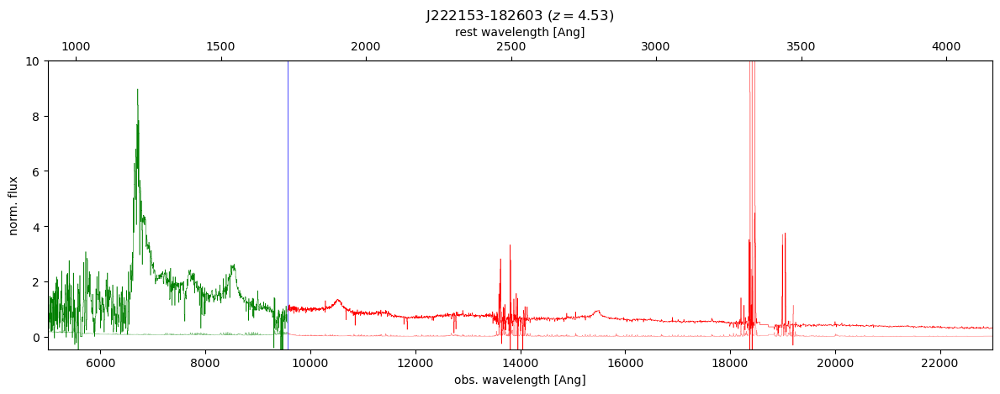

J230430-313427


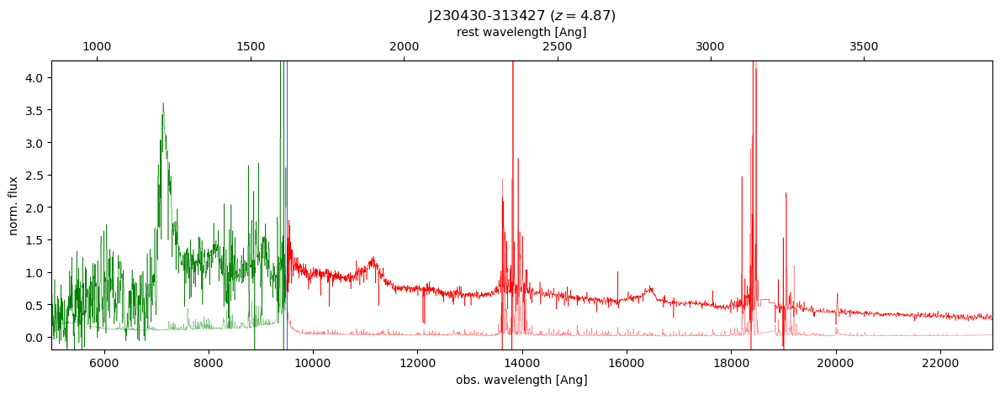

J014742-030248


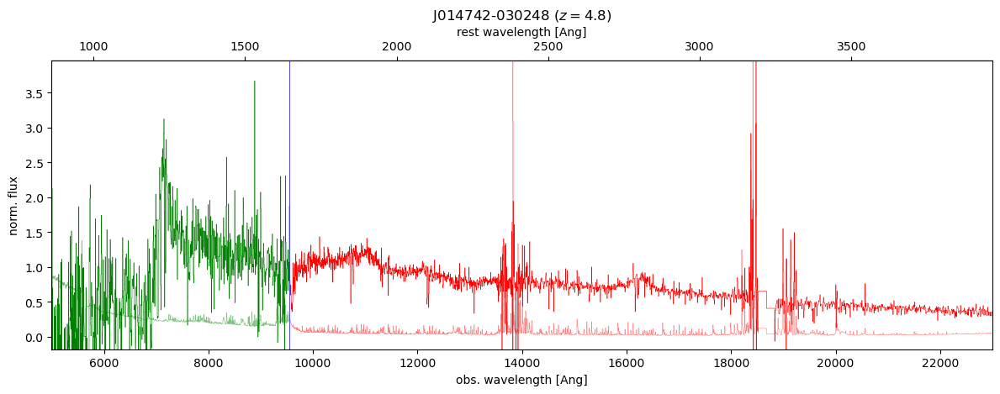

J130031-282931


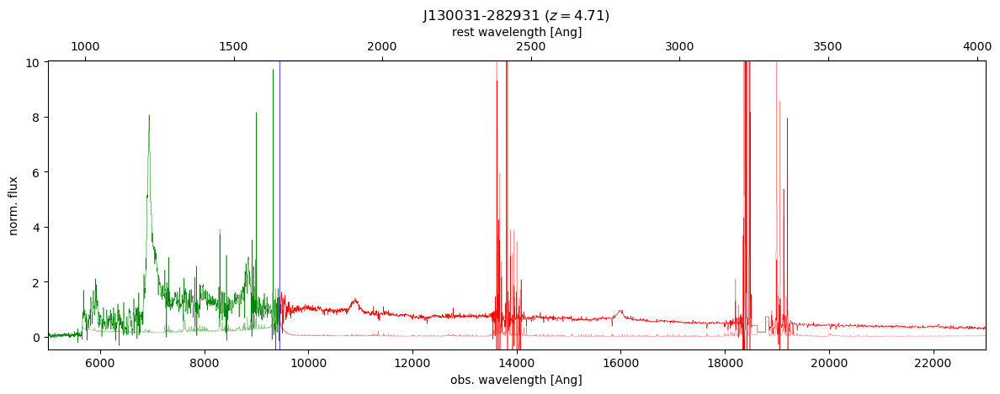

J072012-675632


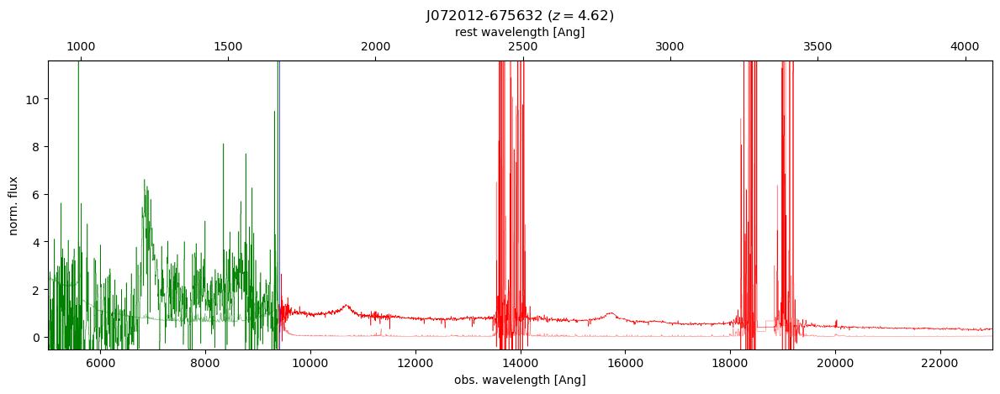

J093033-221208


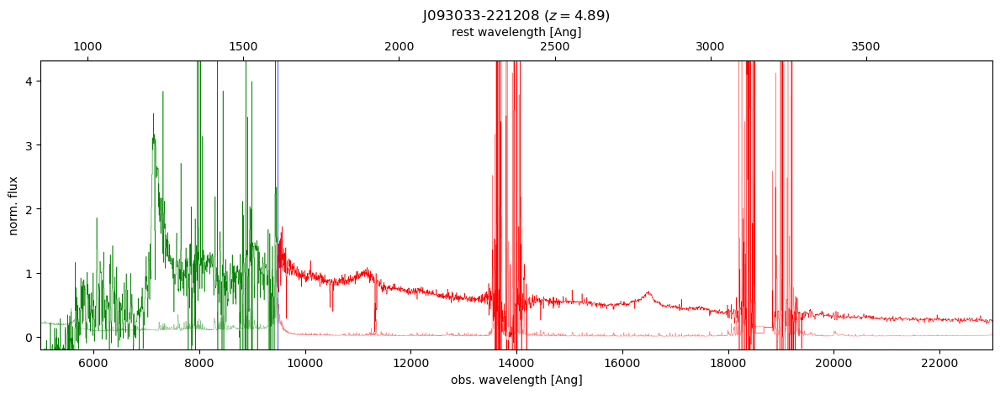

J051509-431854


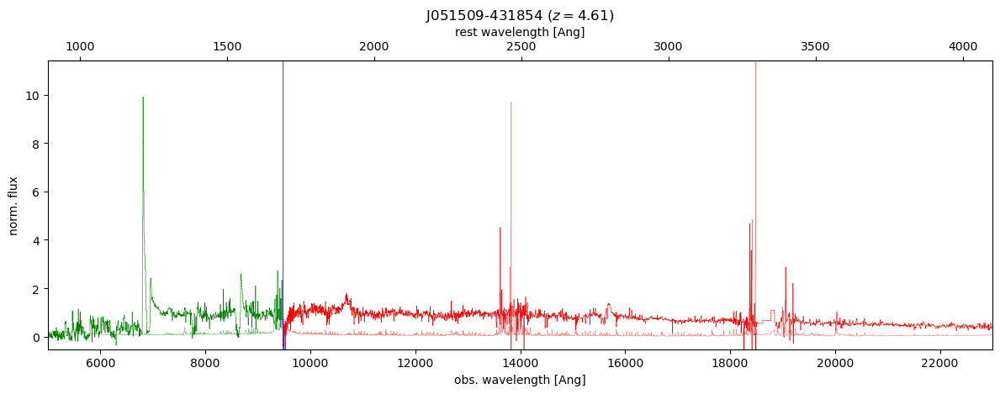

J121402-123548


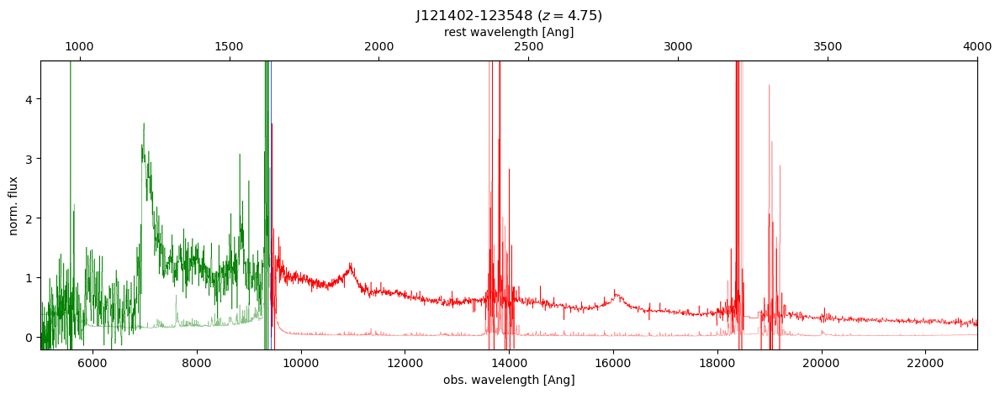

J045428-050049


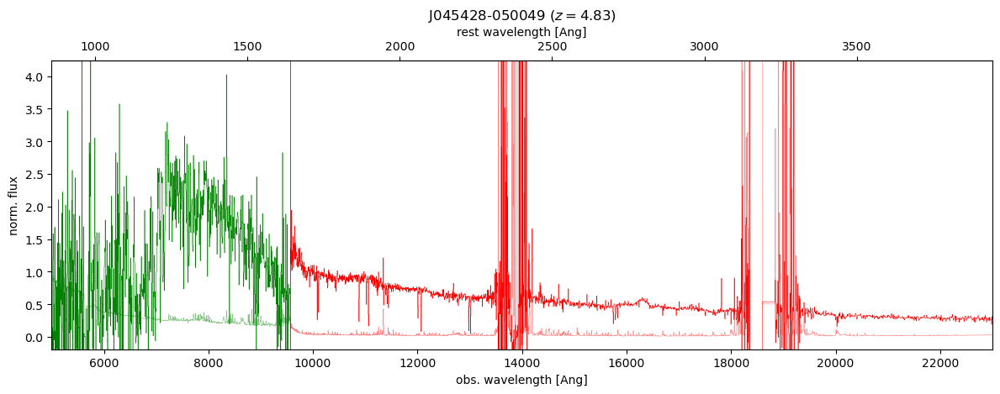

J162551.54-043049.4


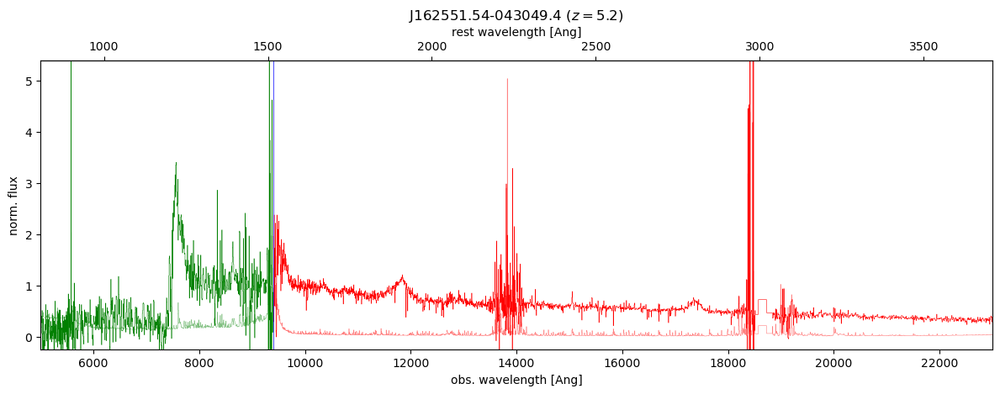

J140802-275820


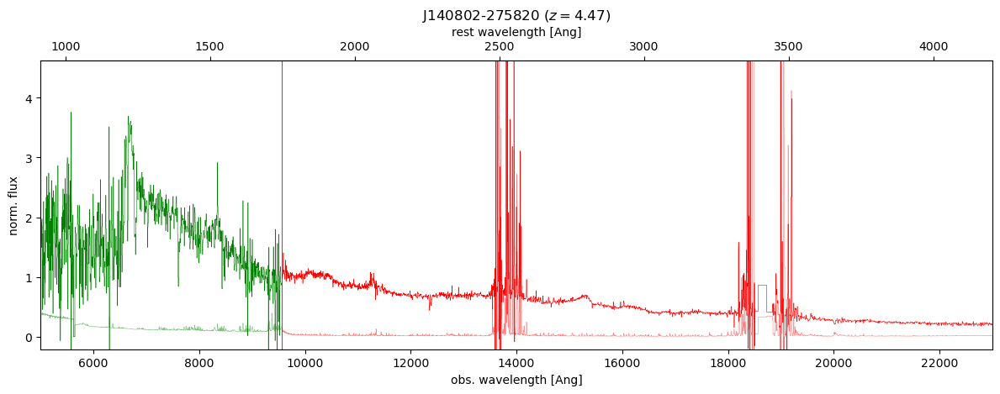

J040915-275633


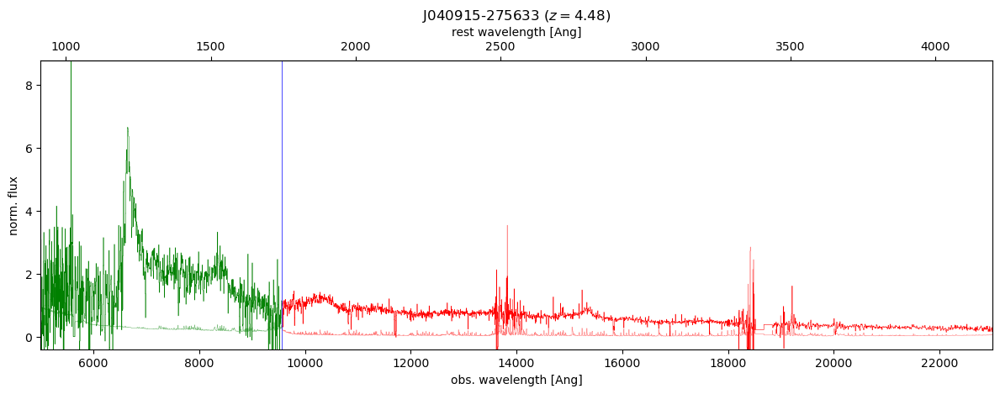

In [31]:
print(exc)
#exc = ['J222153-182603', 'J230430-313427', 'J014742-030248', 'J130031-282931', 'J072012-675632', 'J093033-221208', 'J051509-431854', 'J121402-123548', 'J045428-050049', 'J162551.54-043049.4', 'J140802-275820', 'J040915-275633']

qmeta = np.loadtxt('/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/XQz5_meta.txt',delimiter = '\t',dtype='str')
qlist= qmeta[:,0] 

pp = PdfPages('plots/stitching2.pdf')
for i,q in enumerate(exc):
    print(q)
    lidx = np.where(qlist == q)[0][0]
    z_in = float(qmeta[lidx][1])

    lidx = np.where(qlist == q)[0][0]
    
    vpath = glob.glob(VIS + '{}.fits'.format(q))[0]
    npath = glob.glob(NIR + '{}.fits'.format(q))[0]


    with fits.open(vpath) as hdul:
        wl_vis, flux_vis, sig_vis = hdul[1].data, hdul[0].data, hdul[2].data
    #wl_vis, flux_vis = np.array([d[0] for d in data_vis]), np.array([d[2] for d in data_vis]) #, np.array([d[3] for d in data_vis])

    with fits.open(npath) as hdul:
        data_nir = hdul[0].data
    #wl_nir, flux_nir = np.array([d[0] for d in data_nir])*10**4, np.array([d[1] for d in data_nir]) #, np.array([d[3] for d in data_nir])
    wl_nir, flux_nir, sig_nir = data_nir[0]*10**4, data_nir[1], data_nir[2]
    
    wl_vis, flux_vis, sig_vis = wl_vis[~np.isnan(flux_vis)], flux_vis[~np.isnan(flux_vis)], sig_vis[~np.isnan(flux_vis)]
    wl_nir, flux_nir, sig_nir = wl_nir[~np.isnan(flux_nir)], flux_nir[~np.isnan(flux_nir)], sig_nir[~np.isnan(flux_nir)]

    wl1_vis, wl2_vis, wl1_nir, wl2_nir = float(qmeta[lidx][2]), float(qmeta[lidx][3]), float(qmeta[lidx][4]), float(qmeta[lidx][5])
    mask_vis = np.logical_and(wl_vis > wl1_vis, wl_vis < wl2_vis)
    mask_nir = np.logical_and(wl_nir > wl1_nir, wl_nir < wl2_nir)
    mean_vis = np.mean(flux_vis[mask_vis])
    mean_nir = np.mean(flux_nir[mask_nir])
    
    overlap_vis = wl_vis > min(wl_nir)
    overlap_nir = wl_nir < max(wl_vis)
    diff=[]
    for j, w in enumerate(wl_vis[overlap_vis]):
        idx_ol, __ = closest(wl_nir[overlap_nir],w)
        diff.append(abs((sig_vis[overlap_vis])[j]/mean_vis-(sig_nir[overlap_nir])[idx_ol]/mean_nir))
    mins_idx = np.argsort(diff)[:5]
    int_mins = [np.sum(diff[id-5:id+5]) for id in mins_idx]
    min_idx = mins_idx[np.argmin(int_mins)]
    wl_sep = (wl_vis[overlap_vis])[min_idx]
    
    wl_vis, flux_vis, sig_vis = wl_vis[wl_vis<wl_sep], flux_vis[wl_vis<wl_sep]/mean_vis, sig_vis[wl_vis<wl_sep]/mean_vis
    wl_nir, flux_nir, sig_nir = wl_nir[wl_nir>wl_sep], flux_nir[wl_nir>wl_sep]/mean_nir, sig_nir[wl_nir>wl_sep]/mean_nir

    wl, flux, sig = np.concatenate((wl_vis,wl_nir),axis=0), np.concatenate((flux_vis,flux_nir),axis=0), np.concatenate((sig_vis,sig_nir),axis=0)
    # save='{}_stitched'.format(q)
    # with open(ST + save + '.txt','w') as nsave:
    #     for x in itertools.zip_longest(wl,flux,sig):
    #         nsave.write('{} \t {} \t {}\n'.format(*x))
    # nsave.close()
    # # continue

    bin_size = 5
    wl_vrb,flux_vrb,sig_vrb=[],[],[]
    j = 0
    while j <= len(wl_vis)-bin_size:
        wl_vrb.append(np.mean(wl_vis[j:j+bin_size]))
        flux_vrb.append(np.mean(flux_vis[j:j+bin_size]))
        sig_vrb.append(np.sqrt(np.sum([k**2 for k in sig_vis[j:j+bin_size]]))/3)
        j+=bin_size

    bin_size = 3
    wl_nrb,flux_nrb,sig_nrb=[],[],[]
    j = 0
    while j <= len(wl_nir)-bin_size:
        wl_nrb.append(np.mean(wl_nir[j:j+bin_size]))
        flux_nrb.append(np.mean(flux_nir[j:j+bin_size]))
        sig_nrb.append(np.sqrt(np.sum([k**2 for k in sig_nir[j:j+bin_size]]))/3)
        j+=bin_size

    # define plot range
    lya = 1215.67*(1+z_in)
    lya_range = np.logical_and(wl_vis>lya-100, wl_vis<lya+100)
    lya_max = np.max(flux_vis[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,lya_max*1.1)
    #xlimit = (1250,2250)    

    fig,ax = plt.subplots()
    fig.set_figwidth(12)
    # ax.plot(wl_vis,sig_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=0.5)
    # ax.plot(wl_vis,flux_vis,drawstyle='steps-mid',lw=0.4,c='g',alpha=1)
    ax.plot(wl_vrb,sig_vrb,drawstyle='steps-mid',lw=0.4,c='g',alpha=0.5)
    ax.plot(wl_vrb,flux_vrb,drawstyle='steps-mid',lw=0.4,c='g',alpha=1)
    # ax.plot(wl_nir,sig_nir,drawstyle='steps-mid',lw=0.4,c='r',alpha=0.5)
    # ax.plot(wl_nir,flux_nir,drawstyle='steps-mid',lw=0.4,c='r')
    ax.plot(wl_nrb,sig_nrb,drawstyle='steps-mid',lw=0.4,c='r',alpha=0.5)
    ax.plot(wl_nrb,flux_nrb,drawstyle='steps-mid',lw=0.4,c='r')
    ax.axvline(wl_sep,c='b',lw=0.5)
    #ax.set_ylim(-2*10**(-16),0.6*10**(-15))
    #ax.set_ylim(-0.1,3)
    ax.set_ylim(ylimit)
    ax.set_xlim(5000,23000)
    
    ax.set_xlabel('obs. wavelength [Ang]')
    ax.set_ylabel('norm. flux')
    #plt.legend(loc='upper right')
    plt.title(q + ' ($z={}$)'.format(z_in))

    sax = ax.secondary_xaxis('top', functions=(inv(z_in),func(z_in)))
    sax.set_xlabel('rest wavelength [Ang]')
    plt.tight_layout()
    pp.savefig(fig)
    plt.show()
    plt.close()


    # bin_size = 3
    # wl_rebin,flux_rebin,sig_rebin=[],[],[]
    # j = 0
    # while j <= len(wl)-bin_size:
    #     wl_rebin.append(np.mean(wl[j:j+bin_size]))
    #     flux_rebin.append(np.mean(flux[j:j+bin_size]))
    #     sig_rebin.append(np.sqrt(np.sum([k**2 for k in sig[j:j+bin_size]]))/3)
    #     j+=bin_size
    
    # fig,ax = plt.subplots()
    # fig.set_figwidth(12)
    # ax.plot(wl_rebin,sig_rebin,drawstyle='steps-mid',lw=0.4,c='grey',alpha=0.5)
    # ax.plot(wl_rebin,flux_rebin,drawstyle='steps-mid',lw=0.4,c='grey',alpha=1)
    # #ax.set_ylim(-2*10**(-16),0.6*10**(-15))
    # ax.set_ylim(-0.2,3)
    # ax.set_xlim(5000,18000)
    # plt.show()

pp.close()

J215728.21-360215.1
success


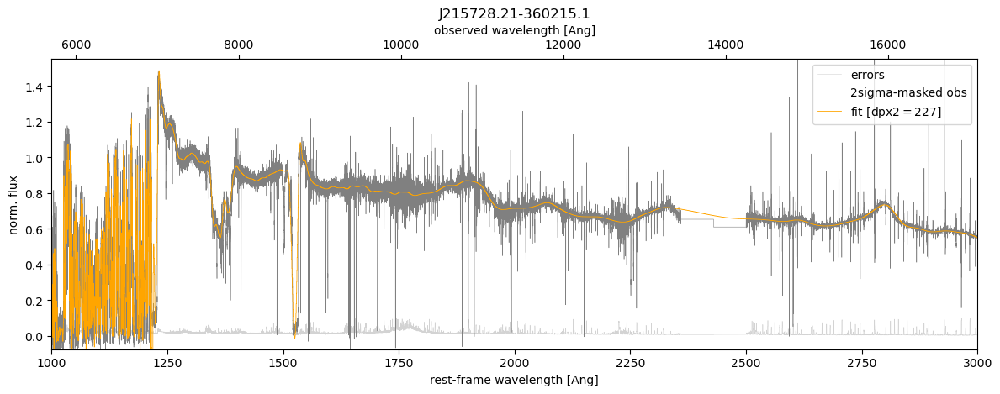

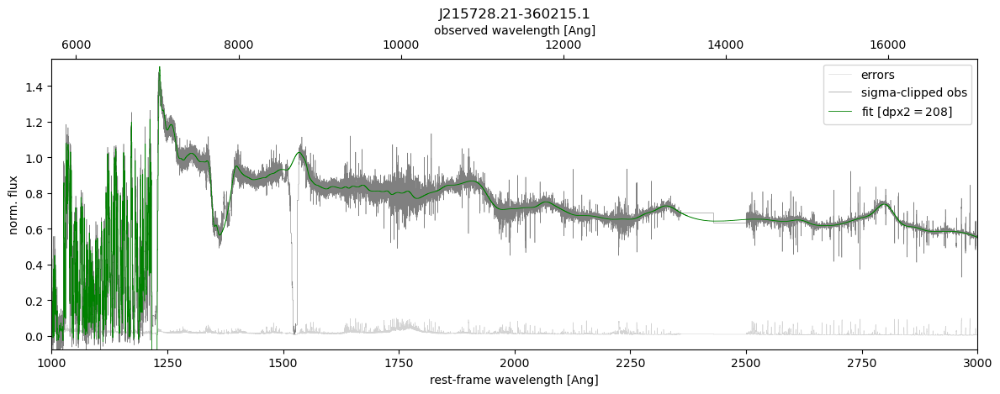

J111055-301130
success


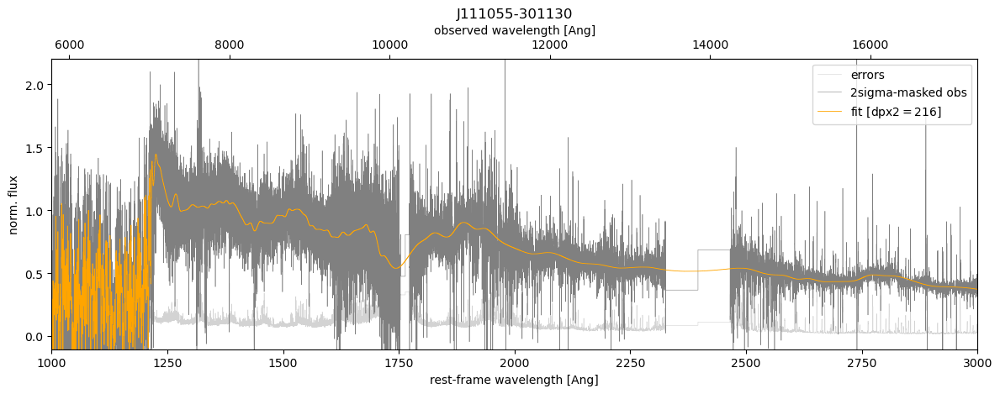

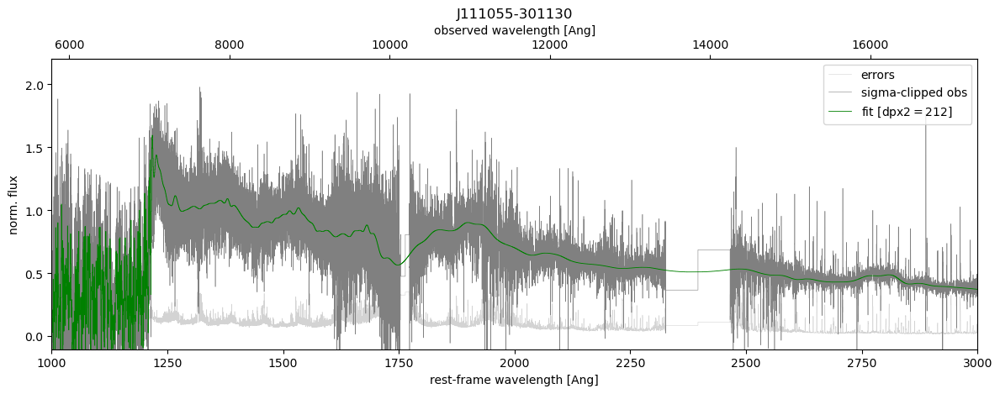

J091656-251146
success


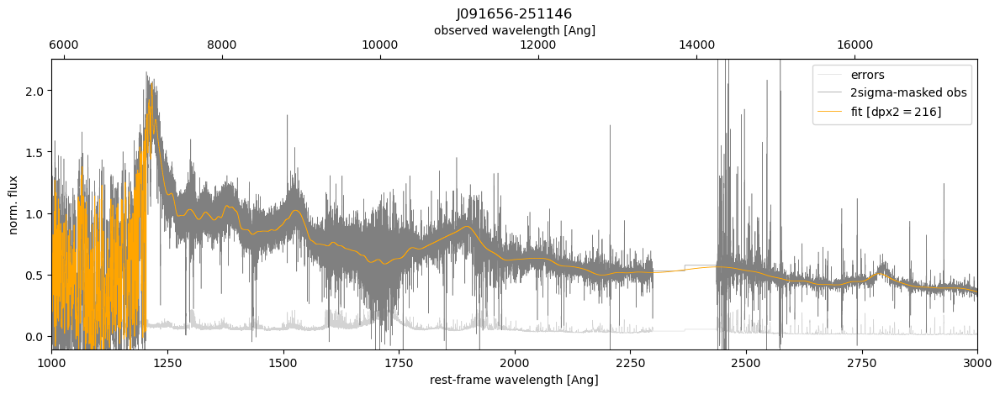

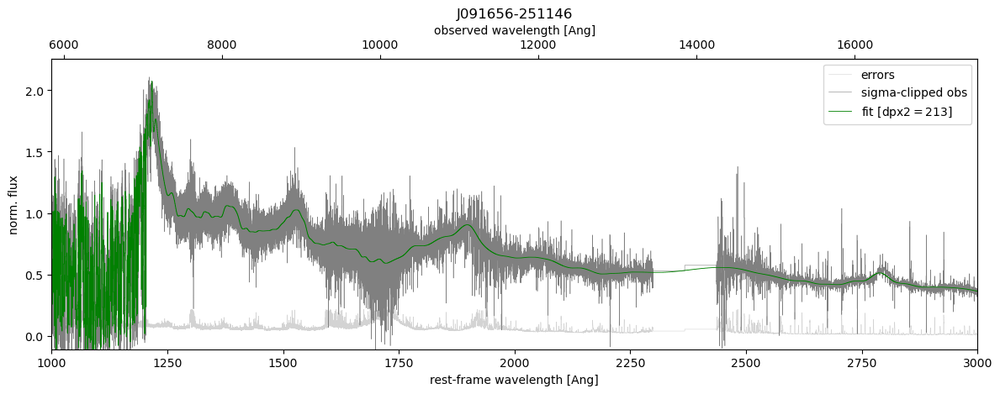

J222153-182603
success


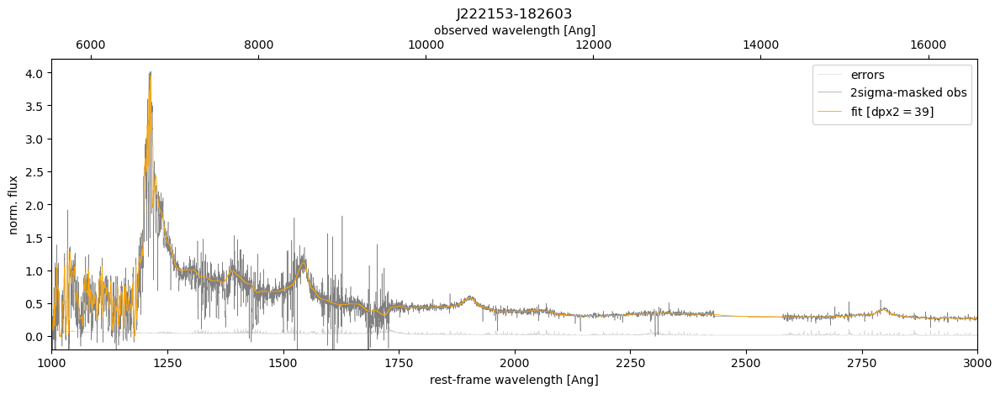

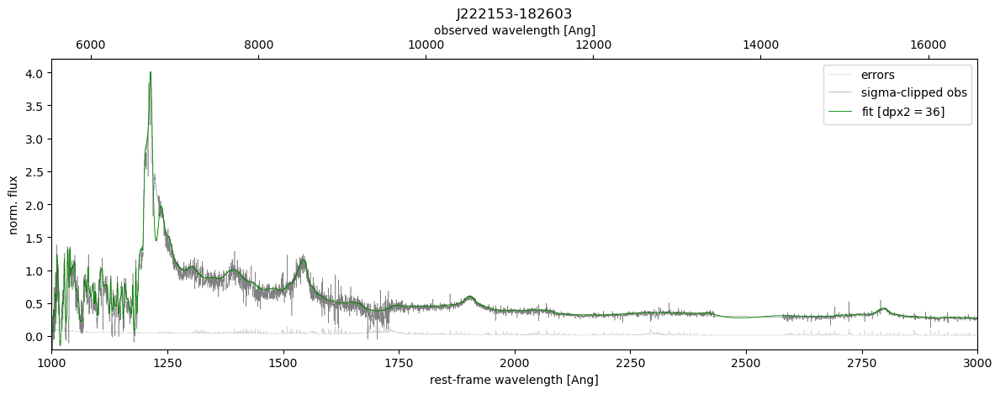

J233505-590103
success


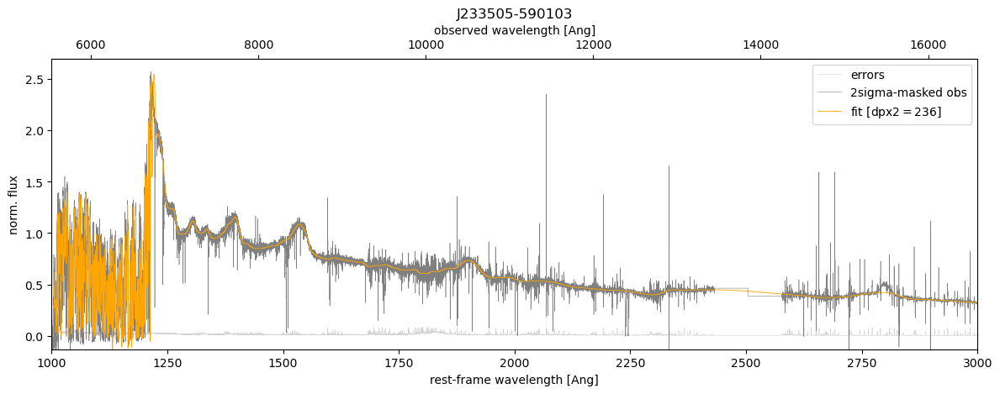

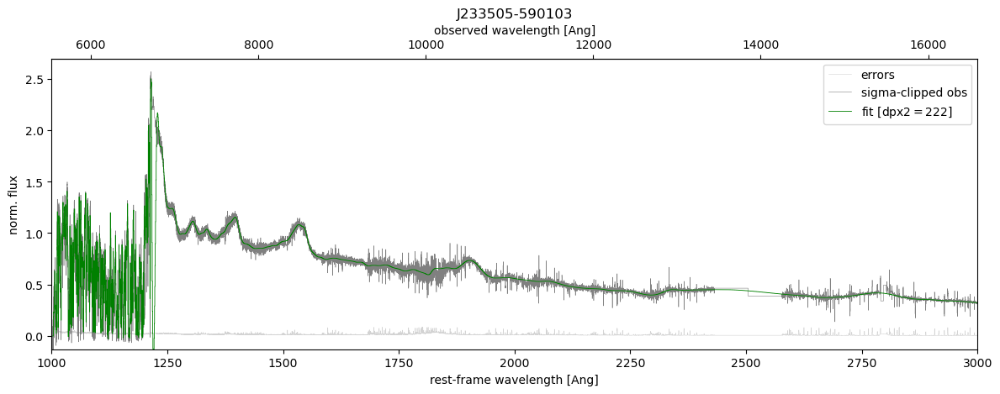

J211921-772253
success


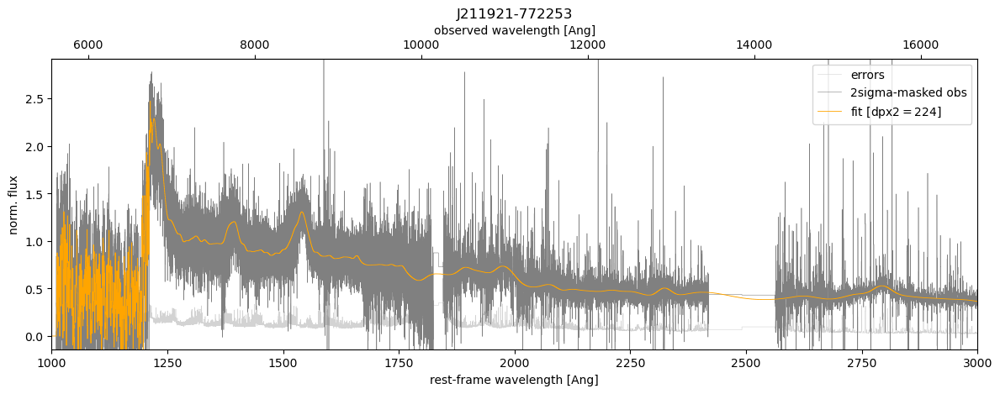

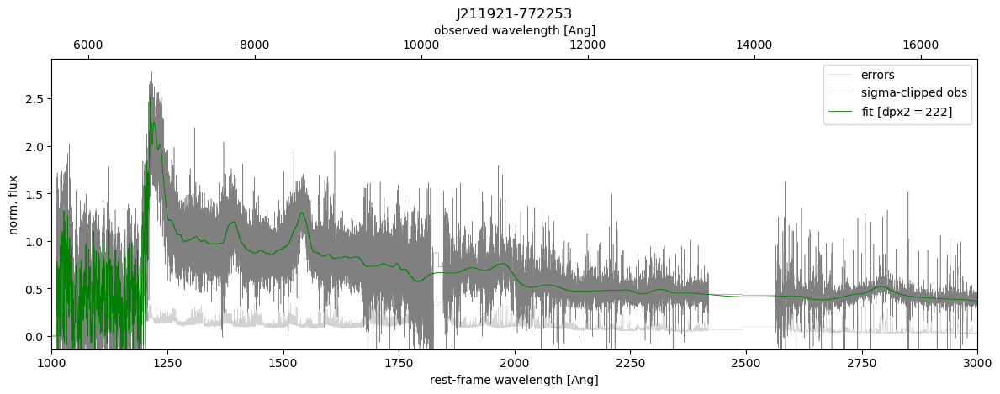

J001225-484830
success


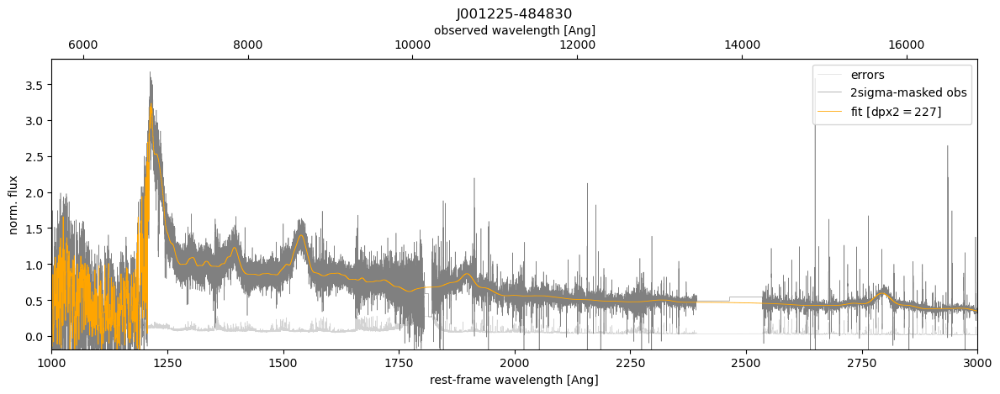

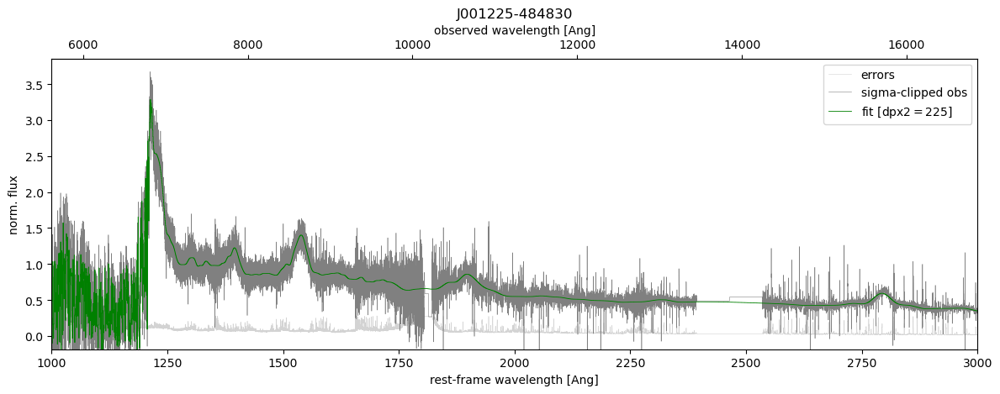

J230430-313427
success


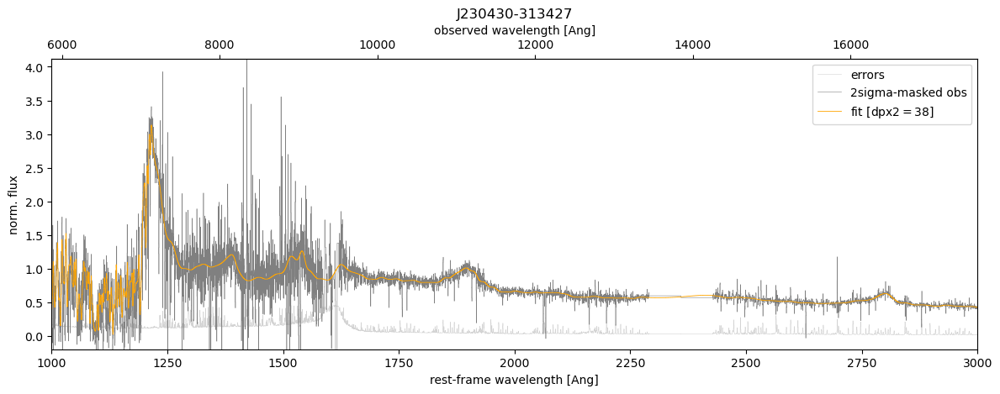

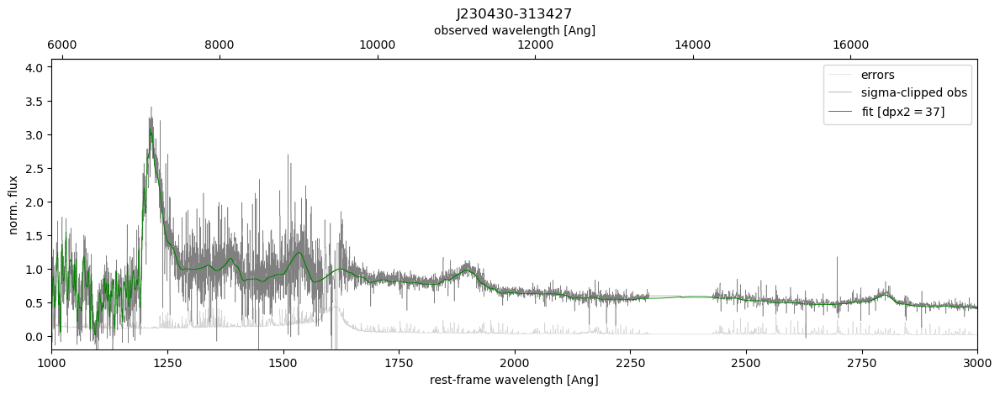

J013539-212628
success


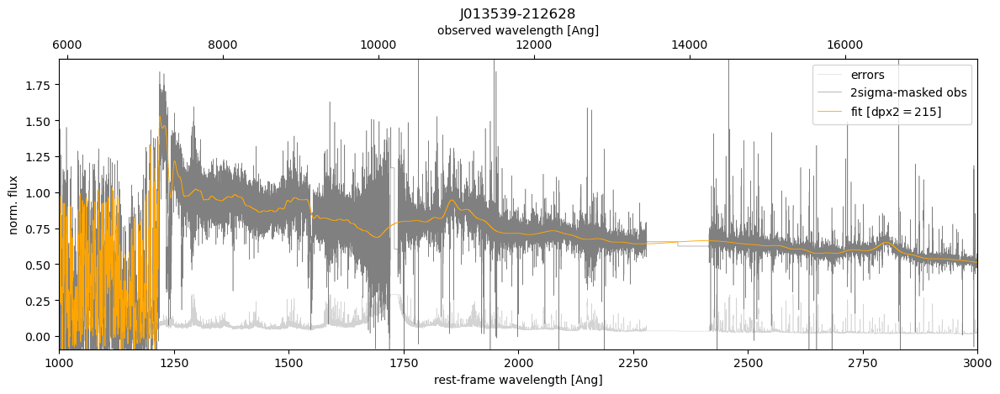

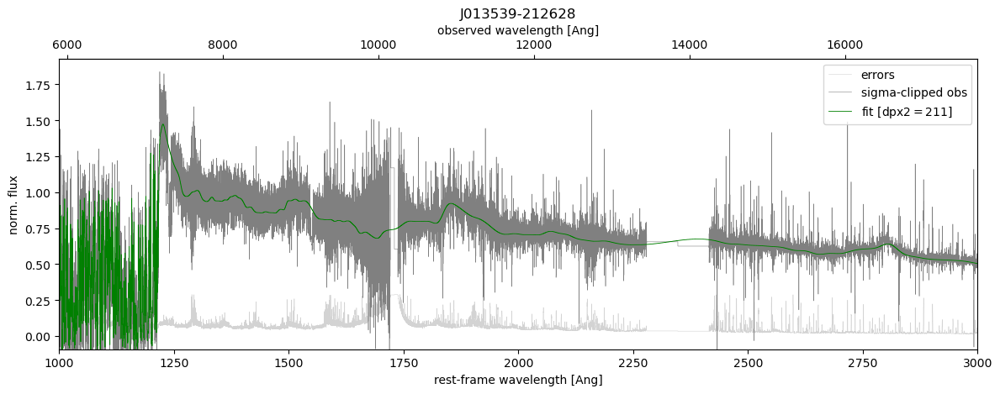

J230349-063343
success


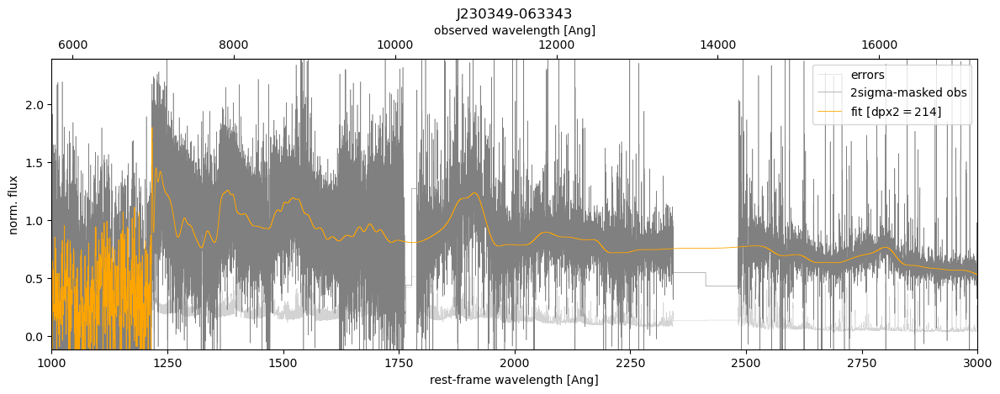

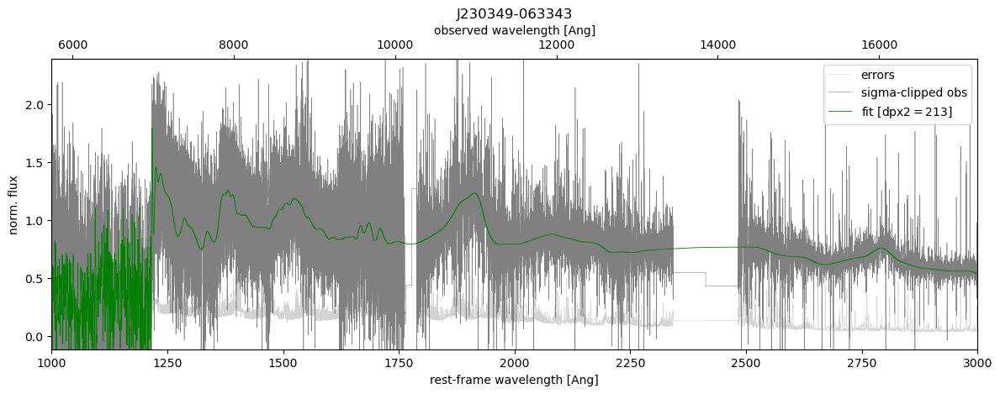

J151443-325024
success


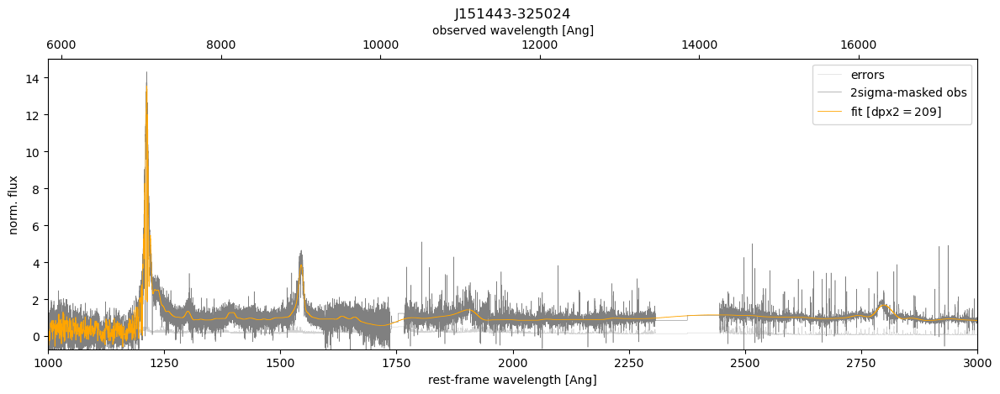

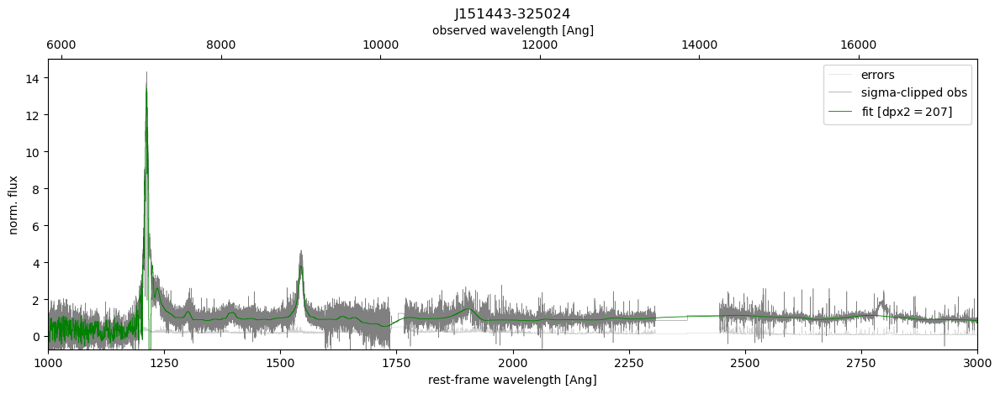

BR 1202-0725
success


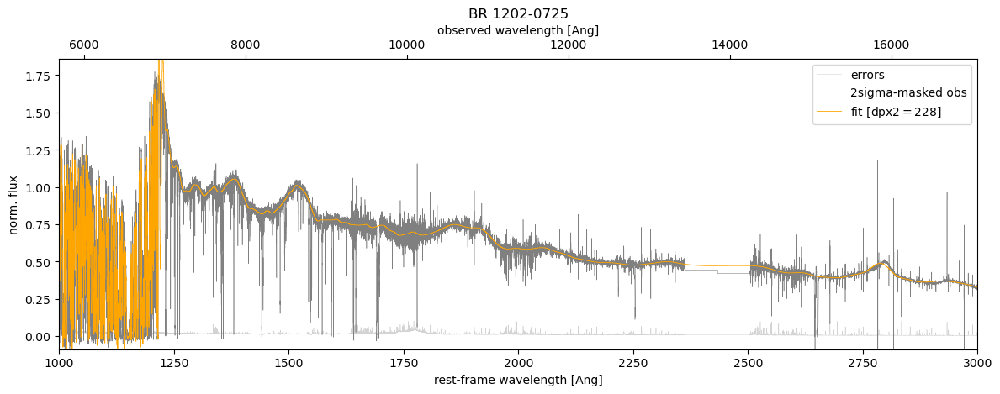

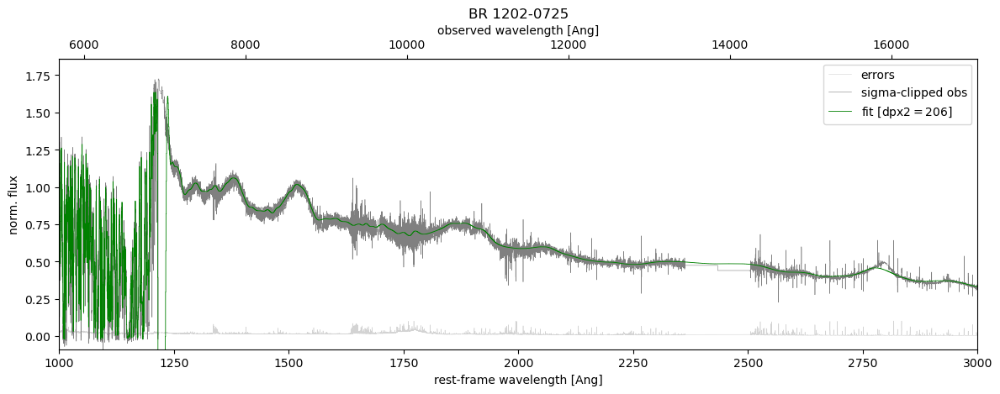

J211105-015604
success


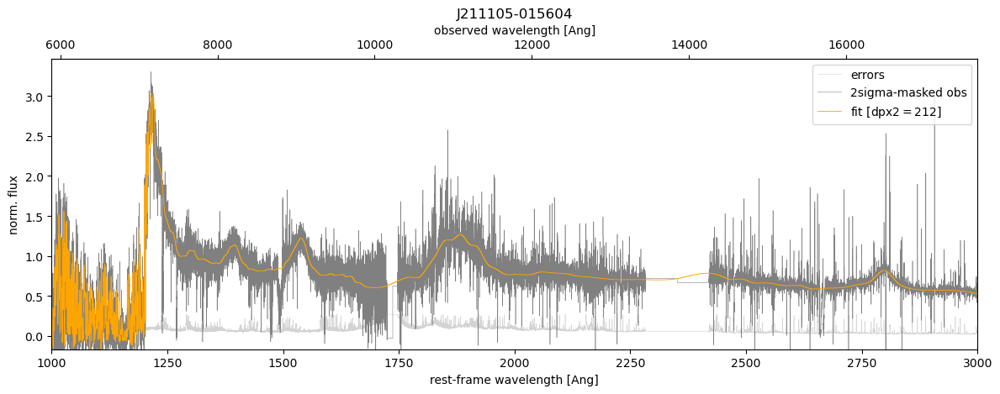

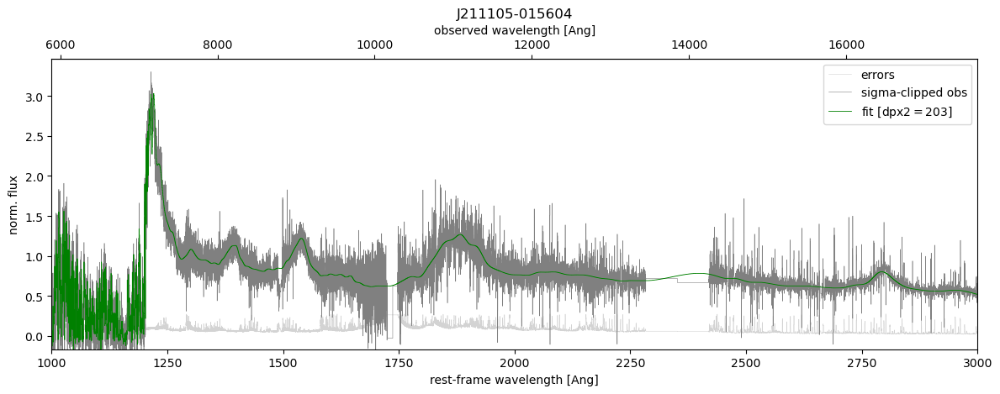

J014742-030248
success


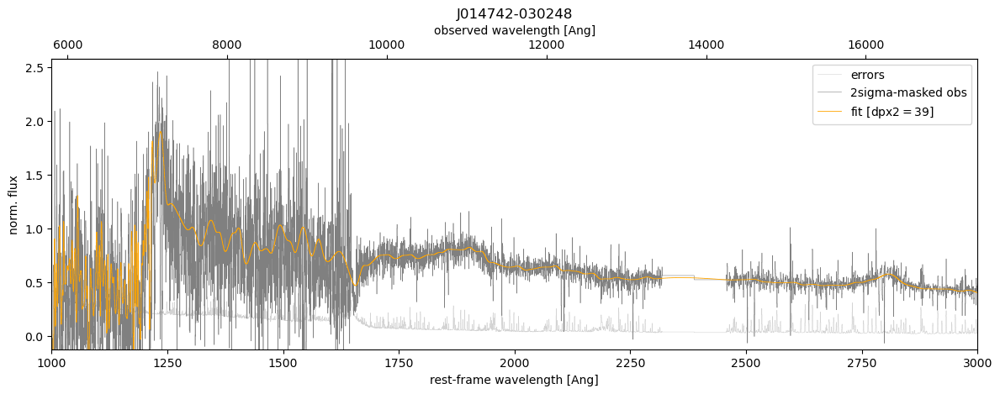

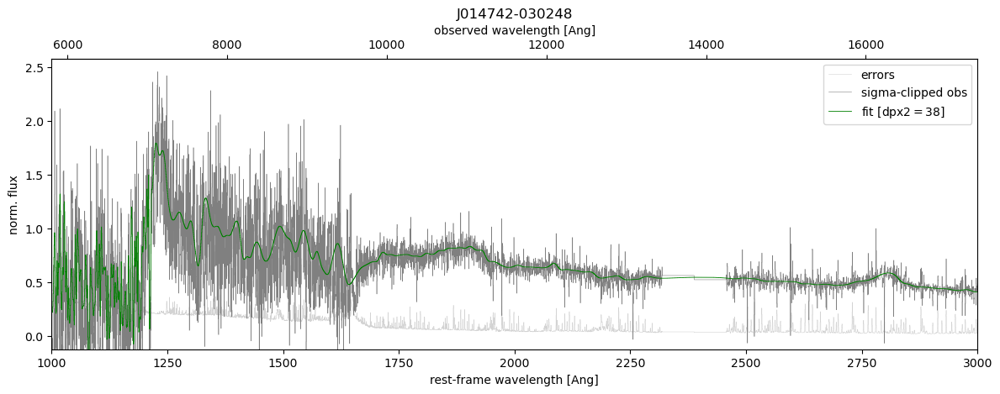

J130031-282931
success


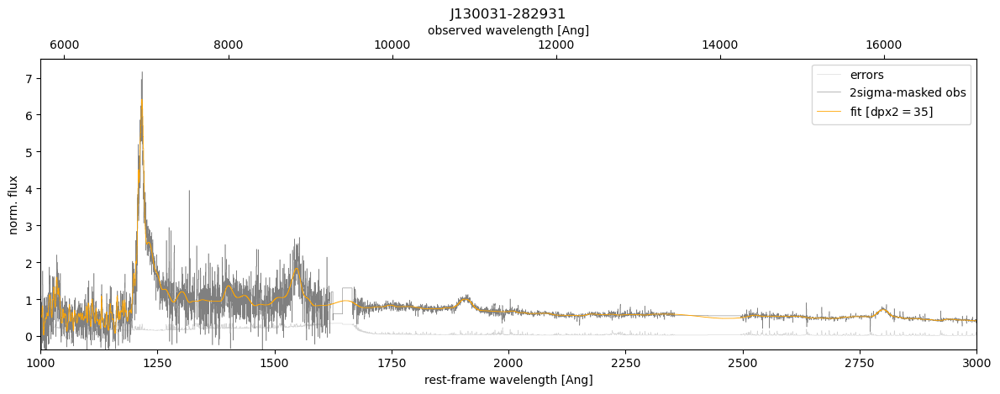

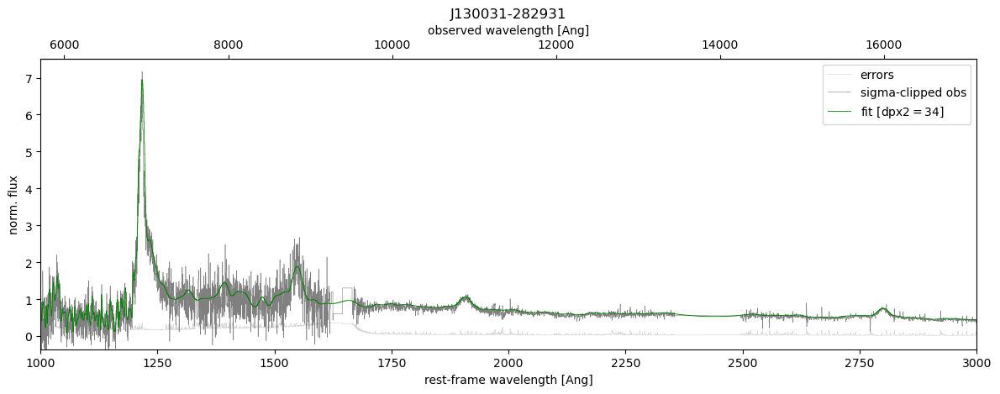

J072012-675632
success


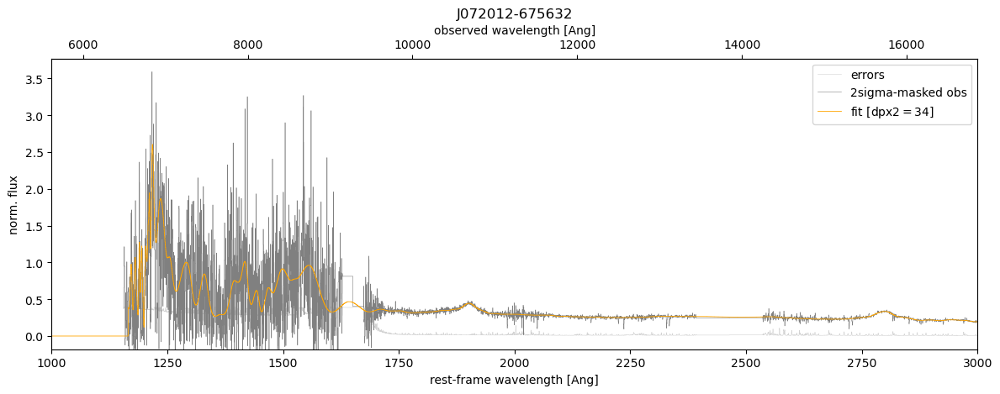

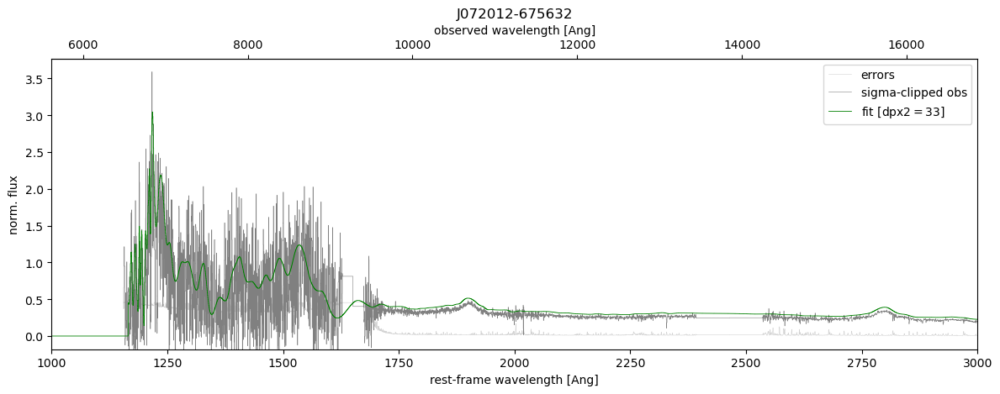

SDSS J001115.23+144601.8
success


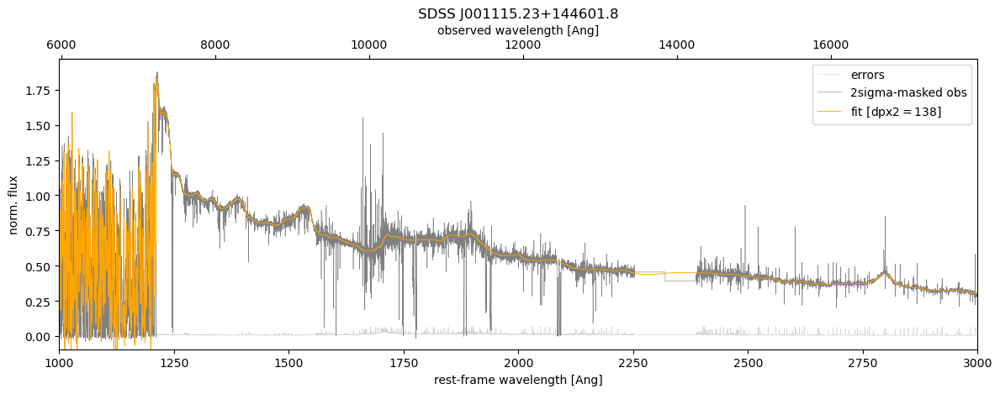

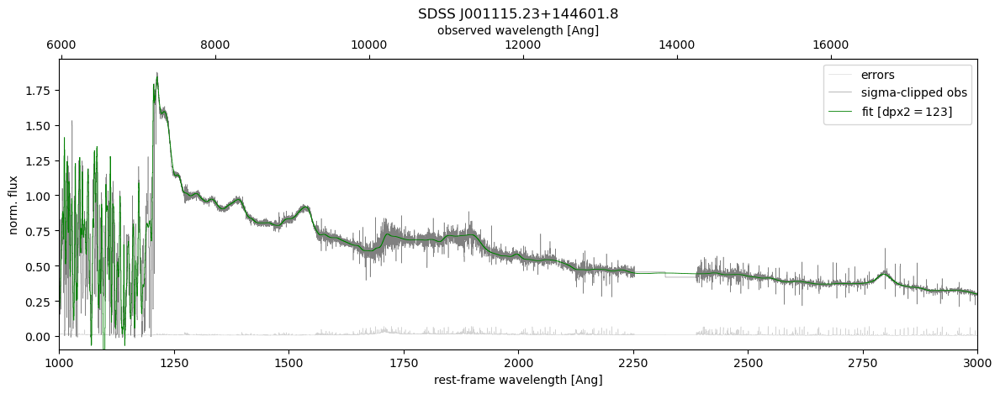

J220159-202627
success


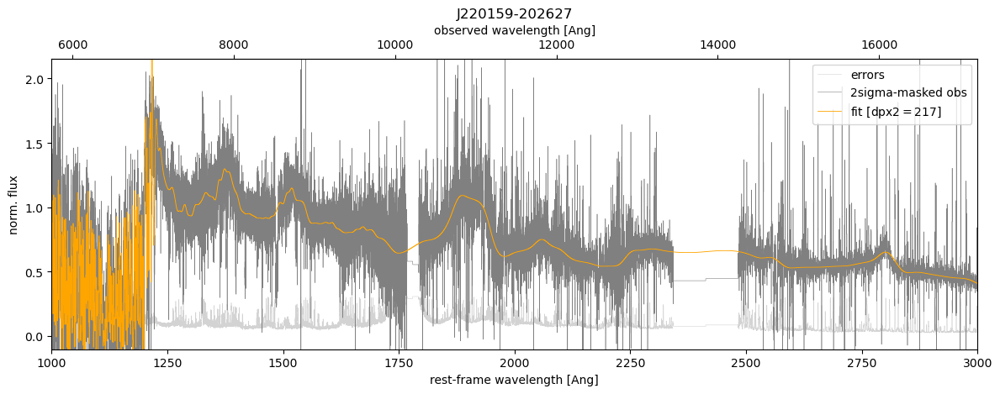

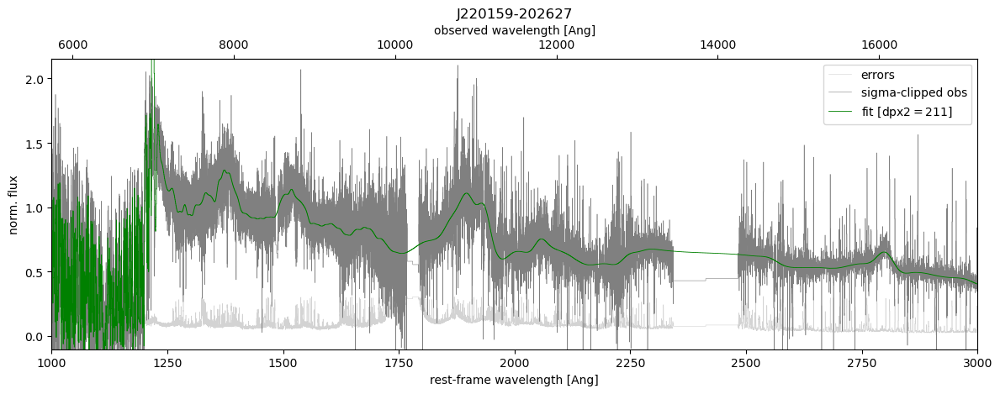

J113522-354839
success


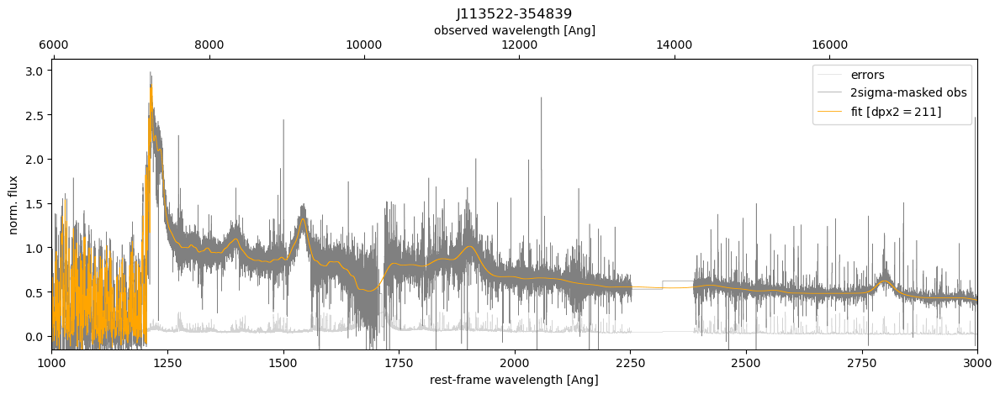

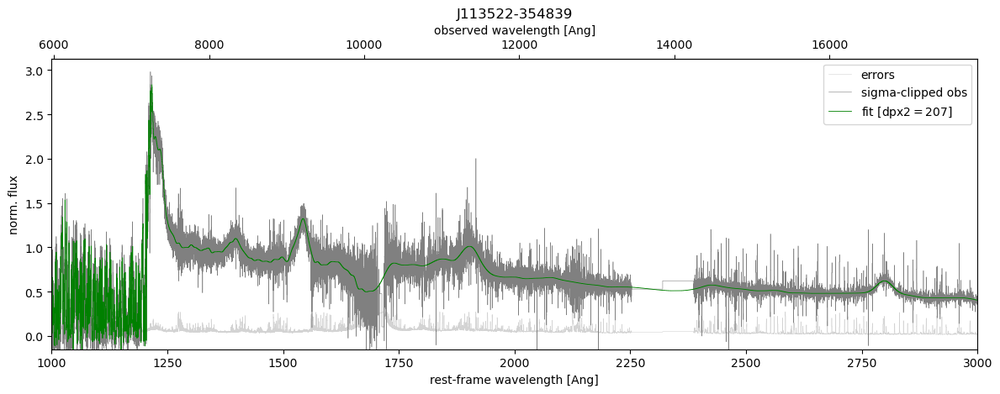

J093033-221208
success


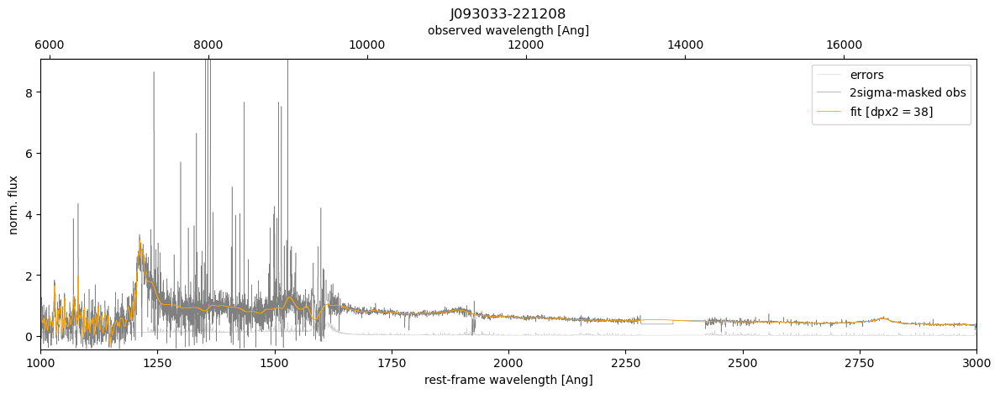

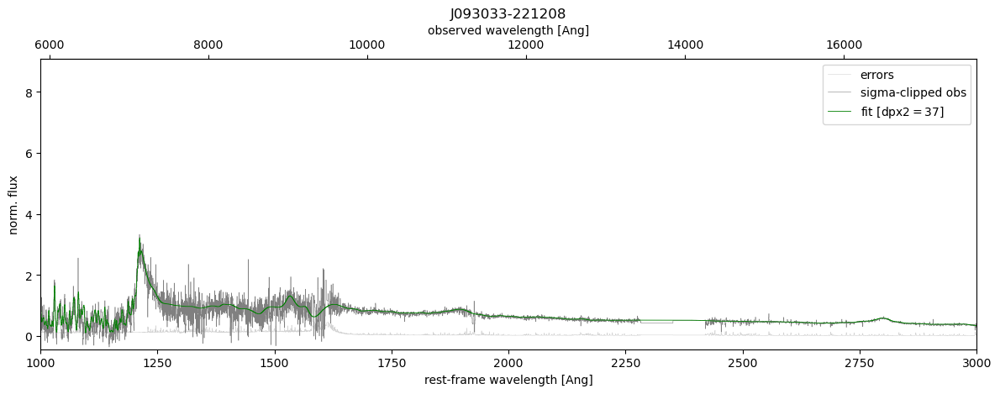

J051509-431854
success


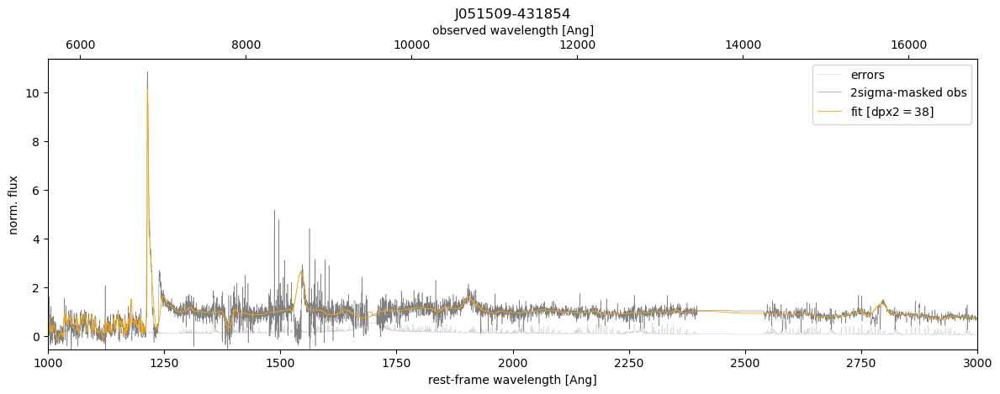

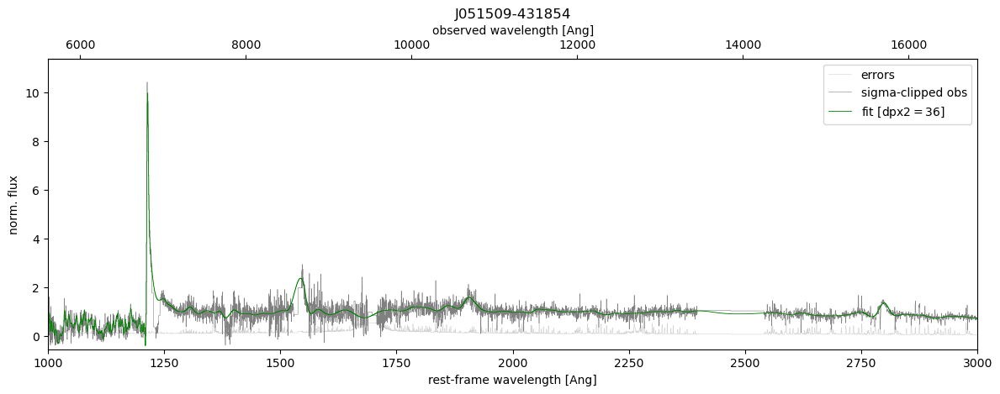

J020437-252315
success


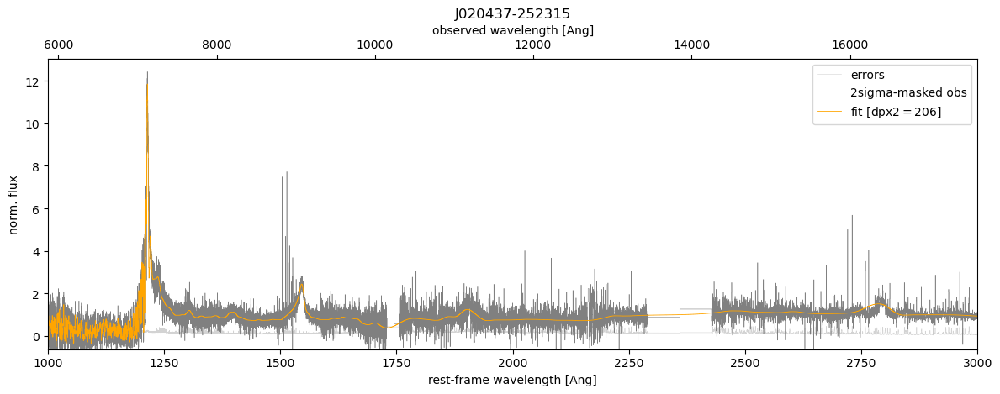

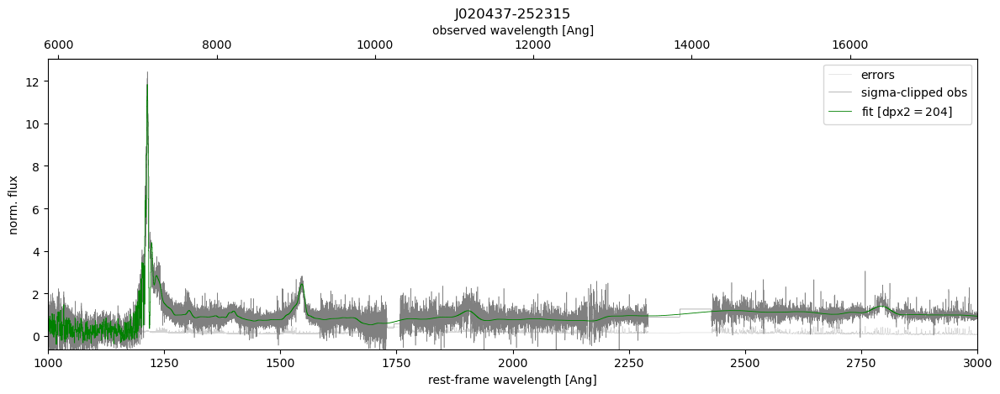

J111520-193506
success


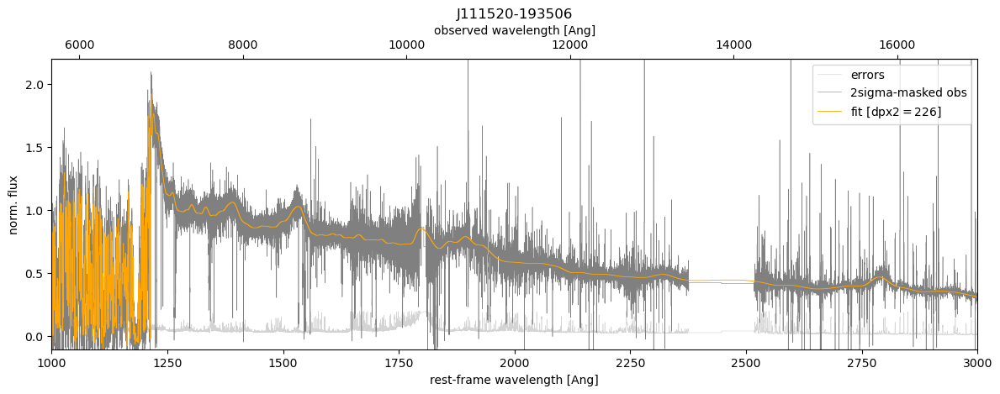

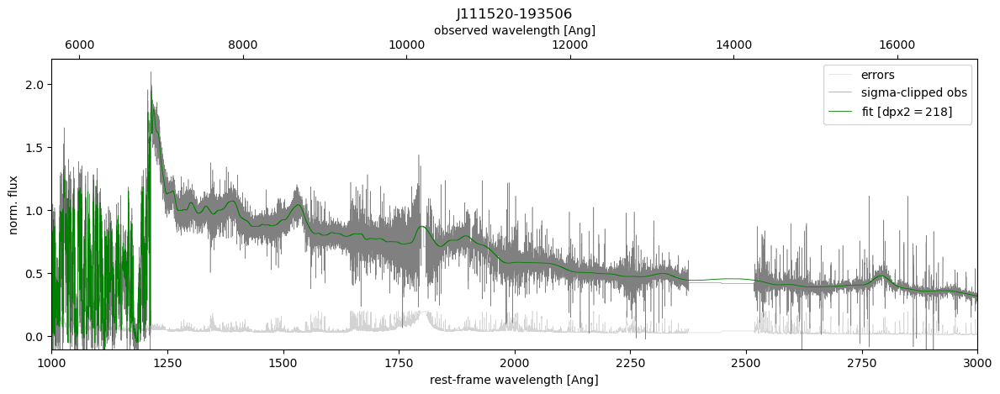

J121402-123548
success


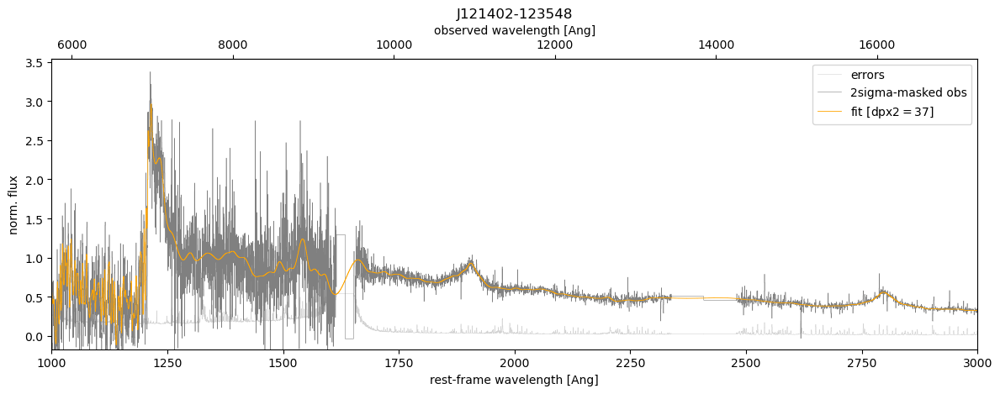

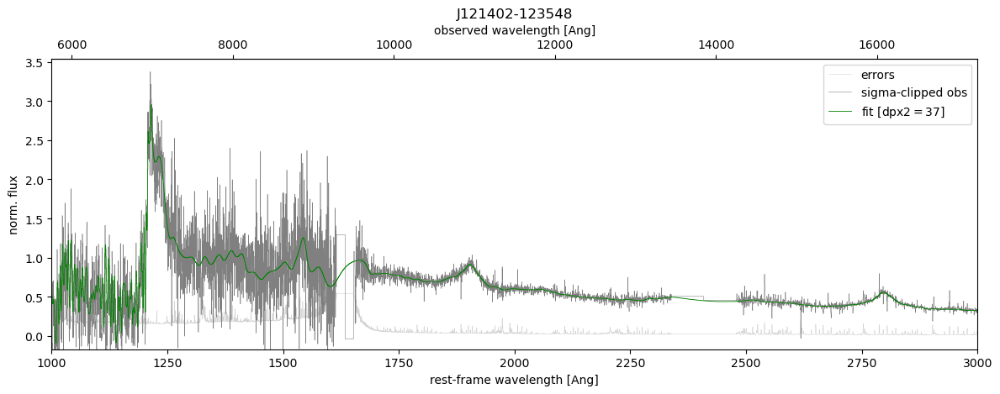

J155657-172107
success


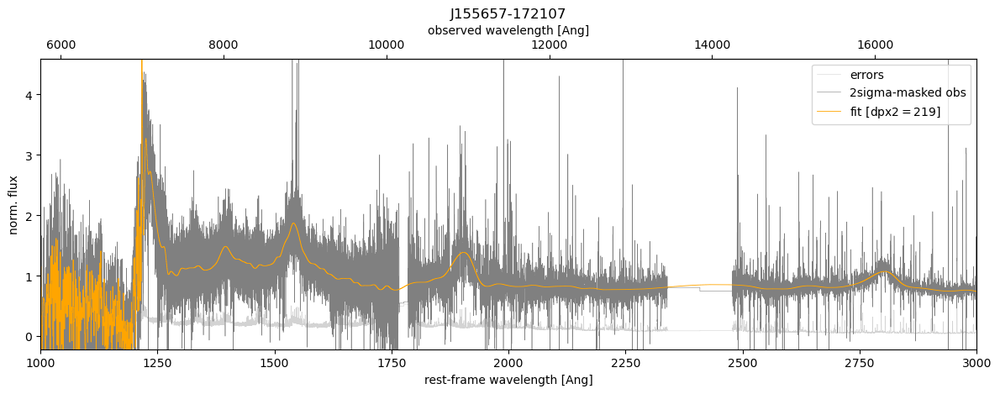

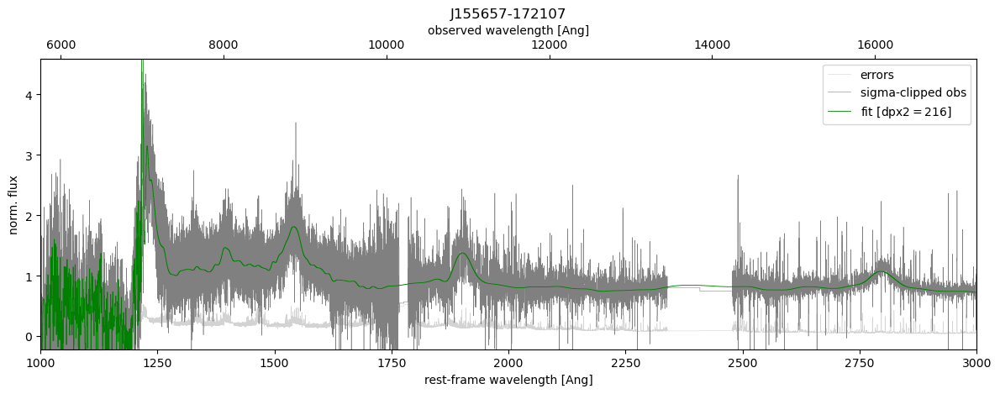

J045428-050049
success


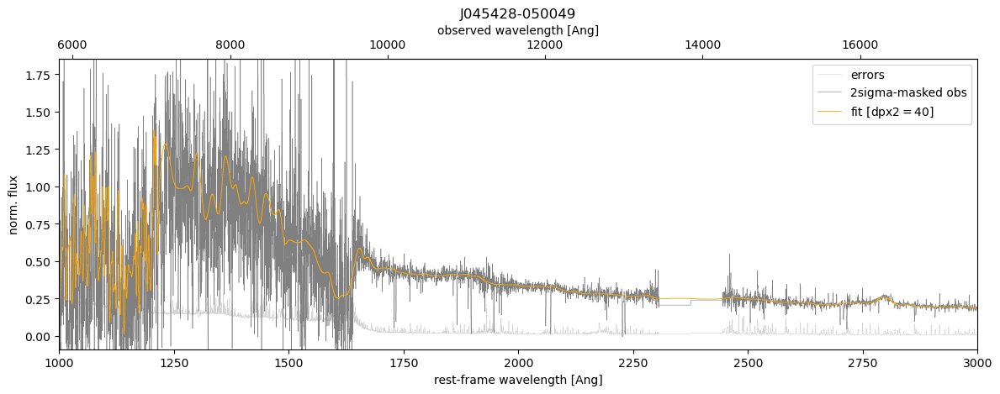

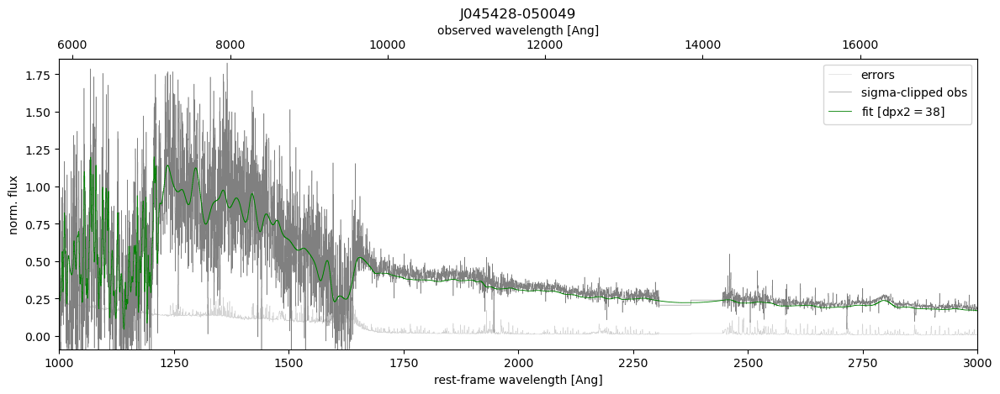

J045057-265541
success


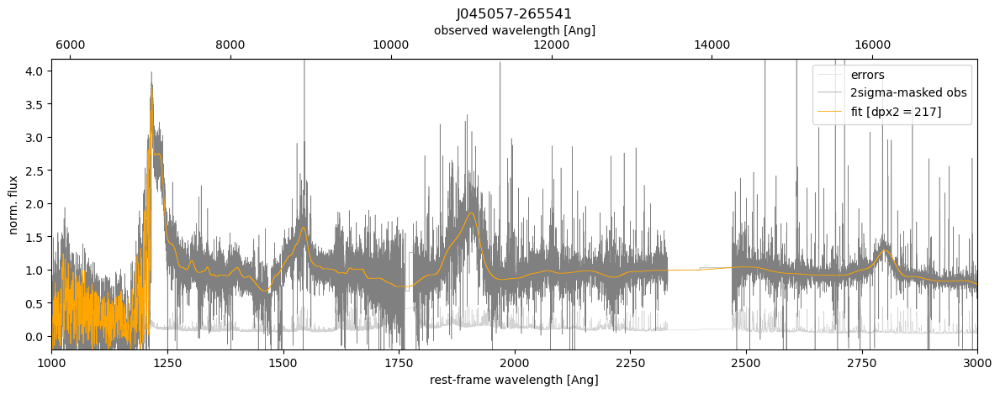

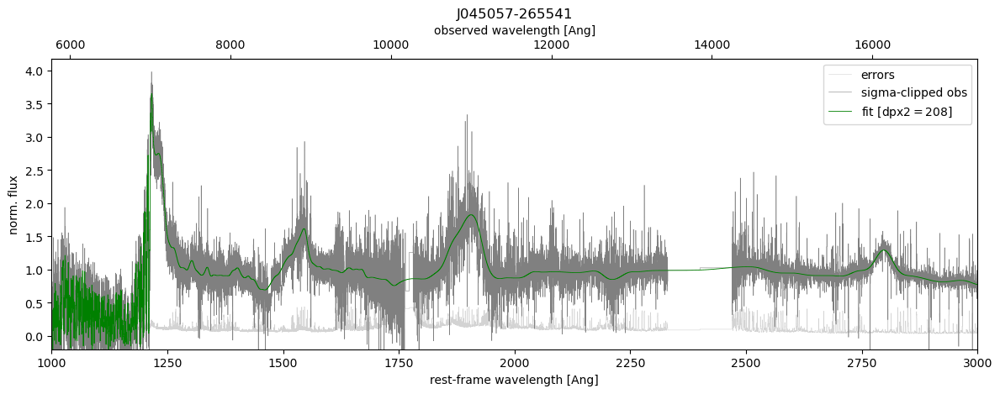

J040733-281031
success


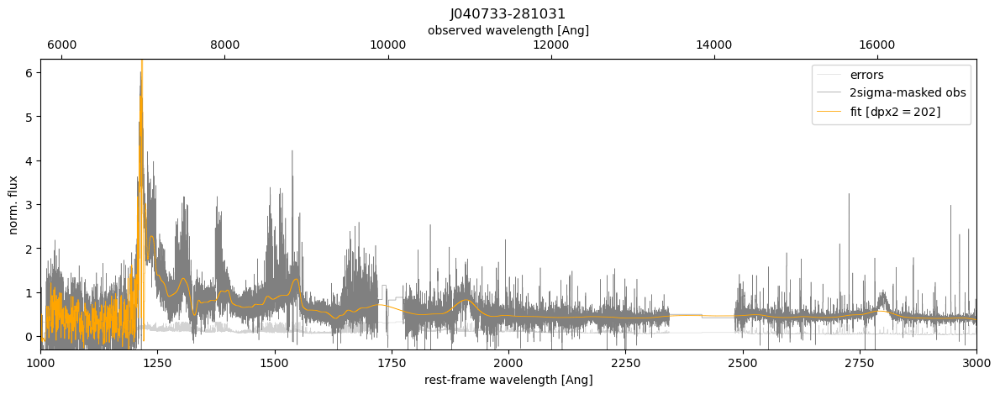

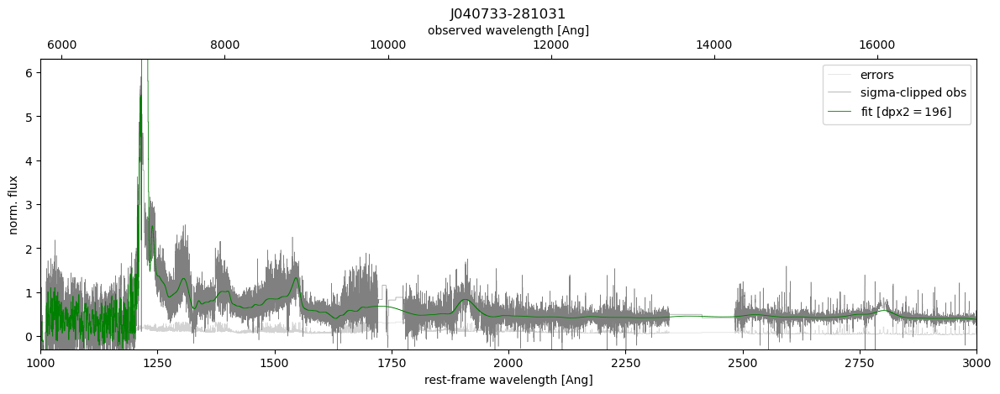

J022307-470902
success


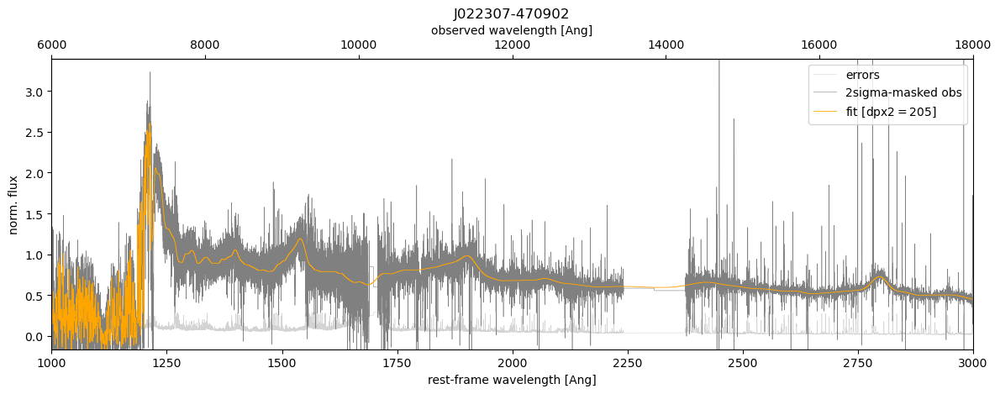

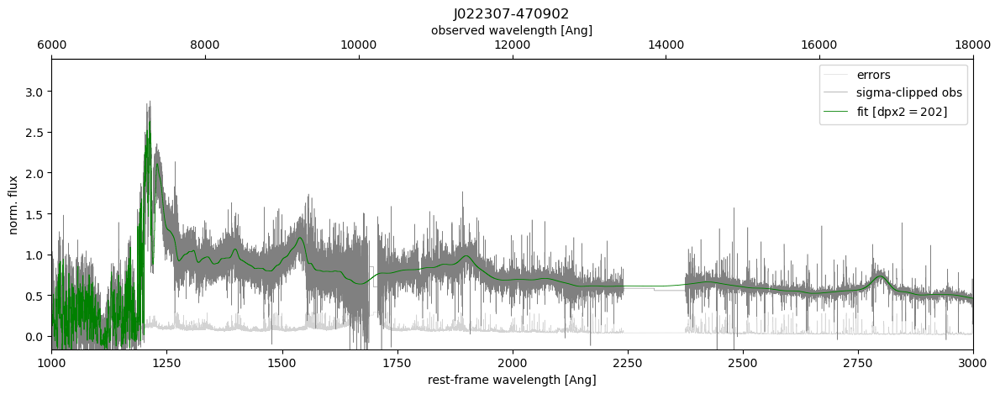

J232953-200039
success


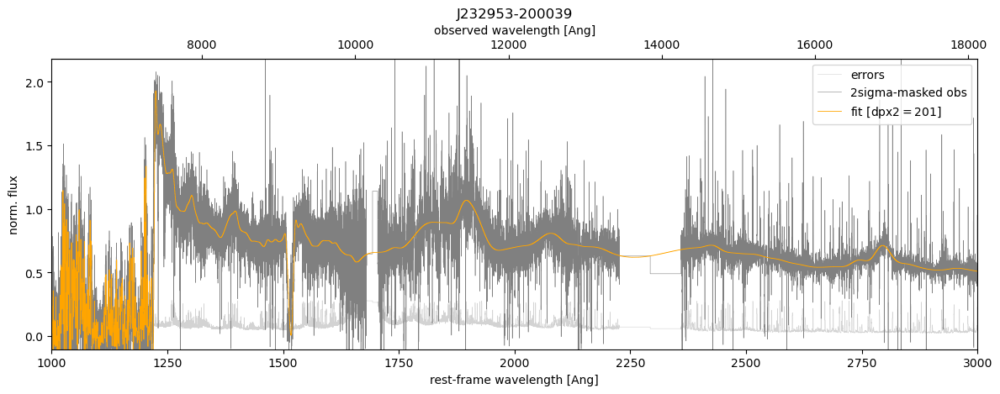

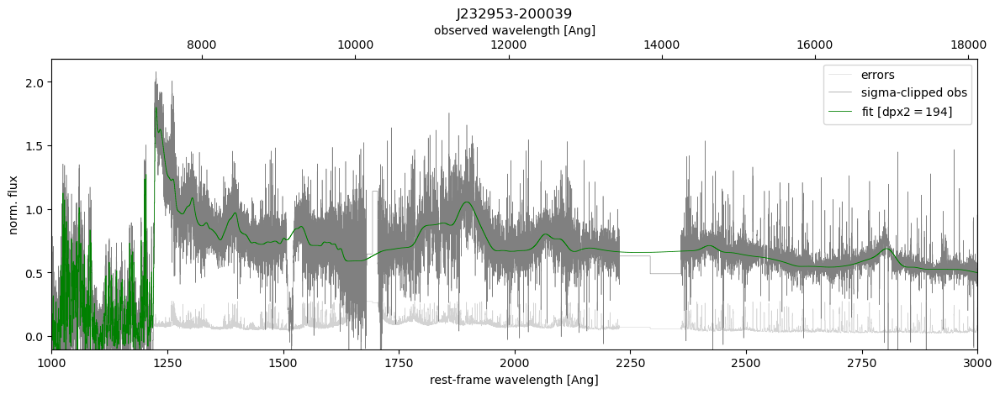

SDSS J002526.84-014532.5
success


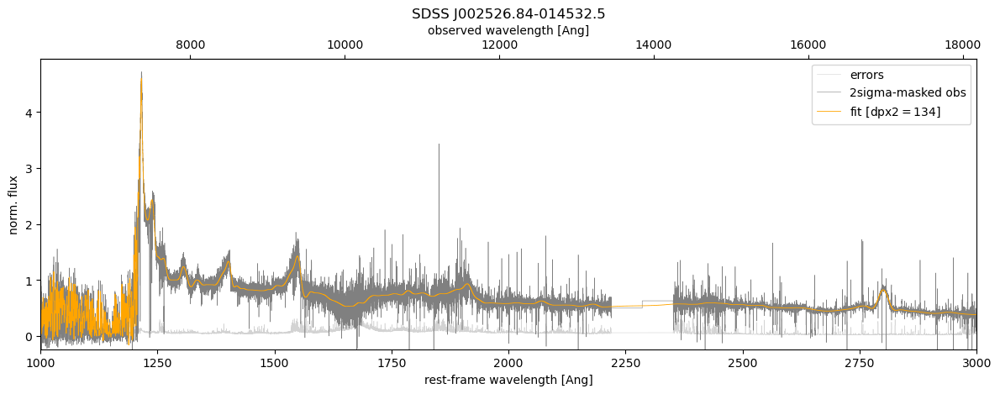

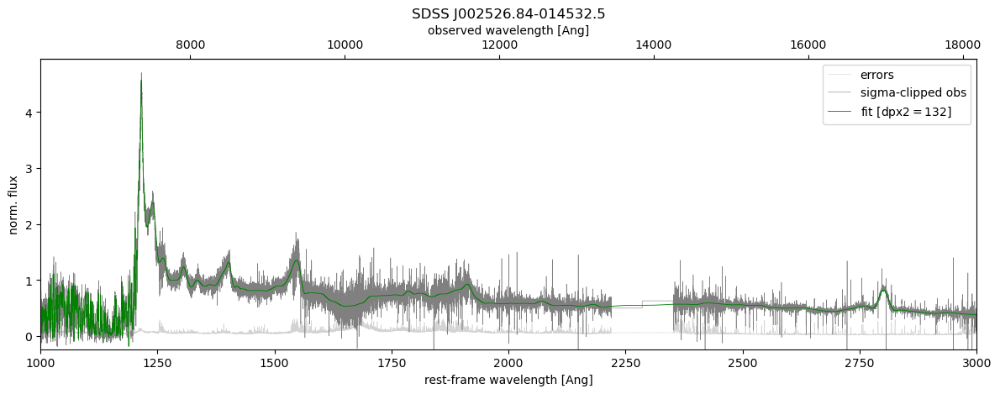

J033703-254832
success


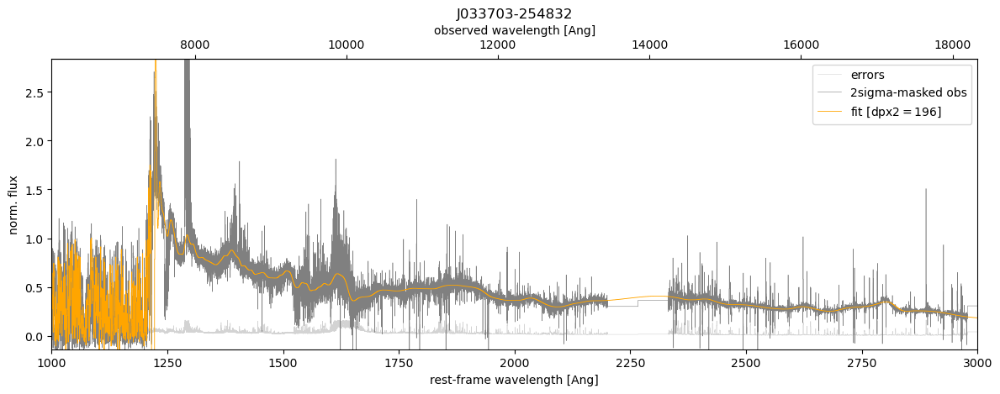

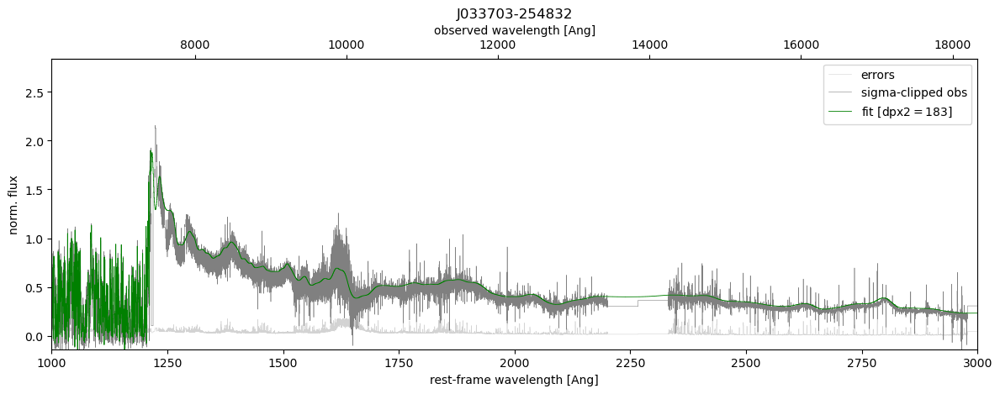

J214608-485819
success


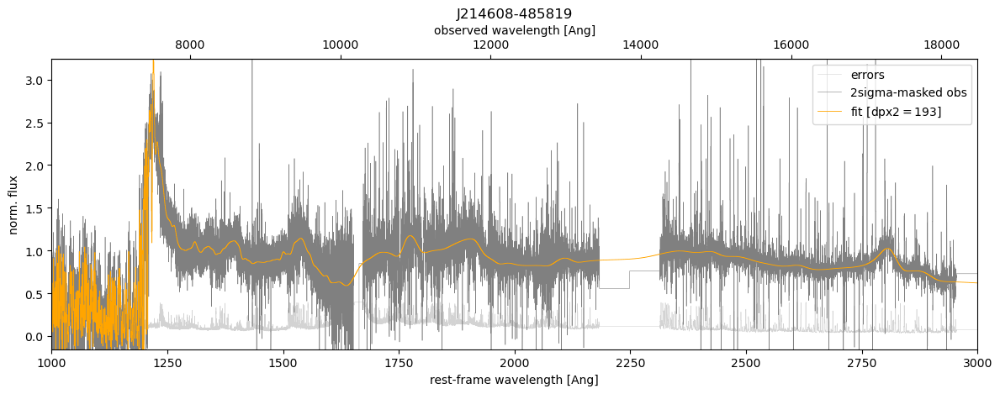

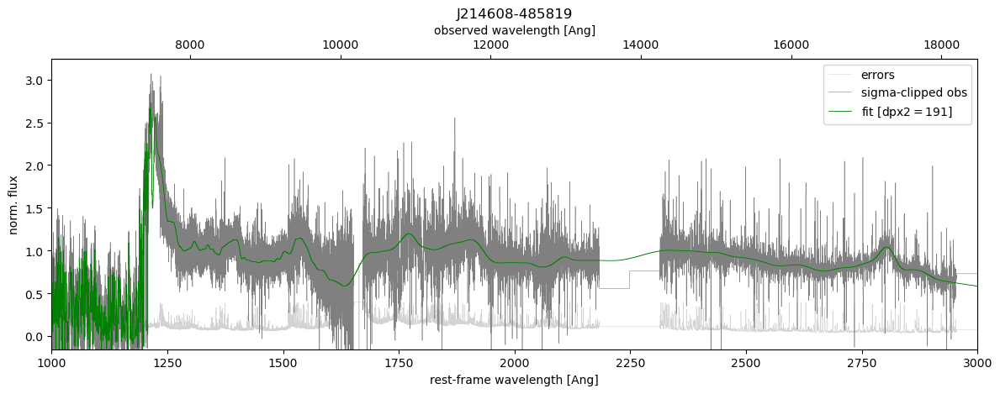

SDSS J095727.86+051905.2
success


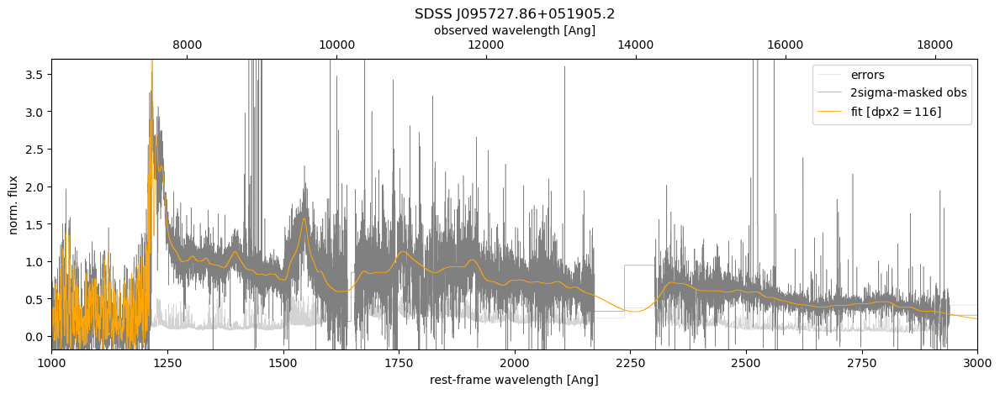

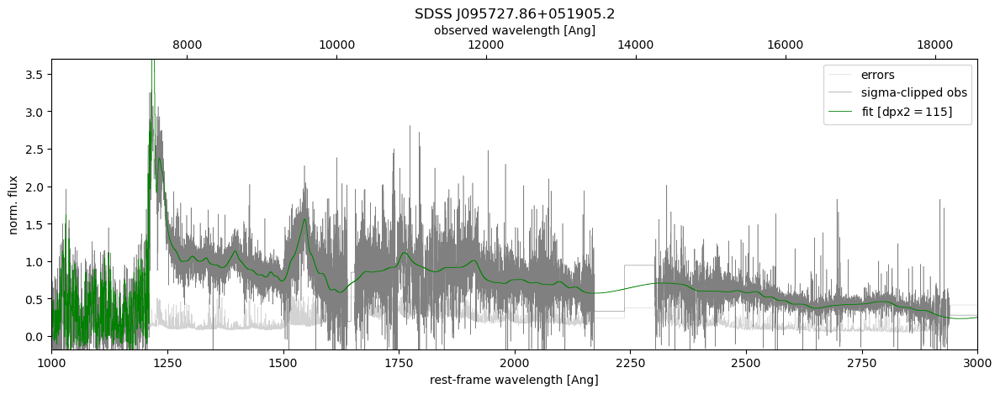

SDSS J013127.34-032100.1
success


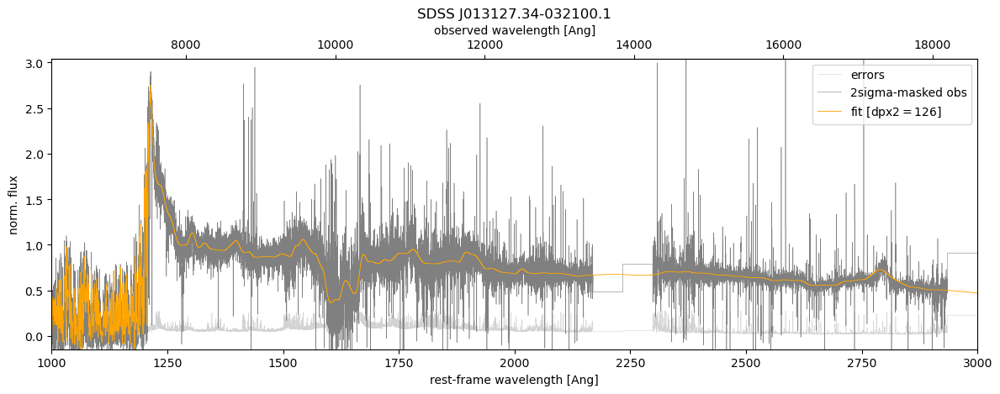

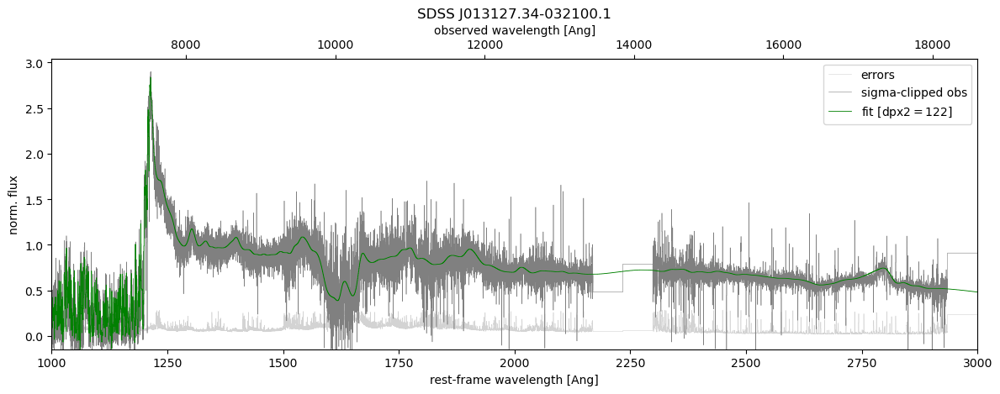

J023649-114734
success


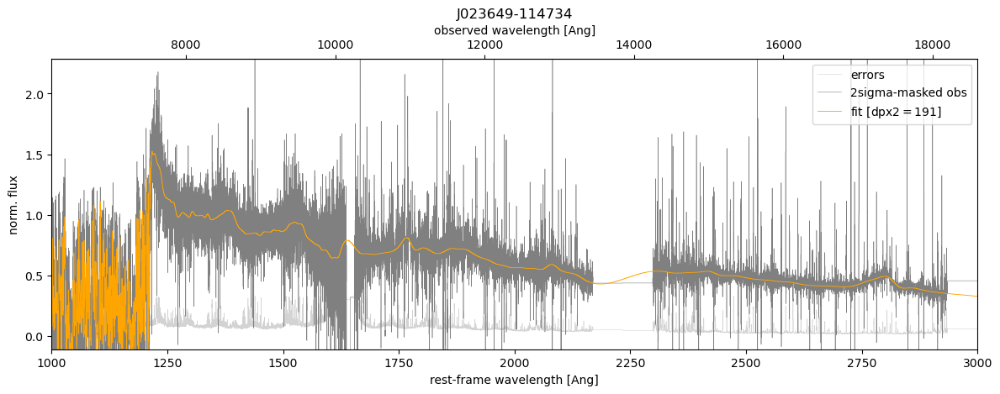

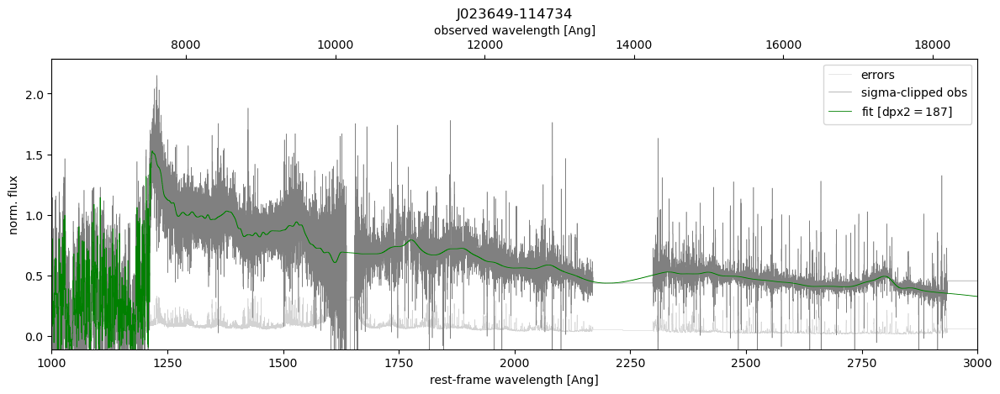

J162551.54-043049.4
success


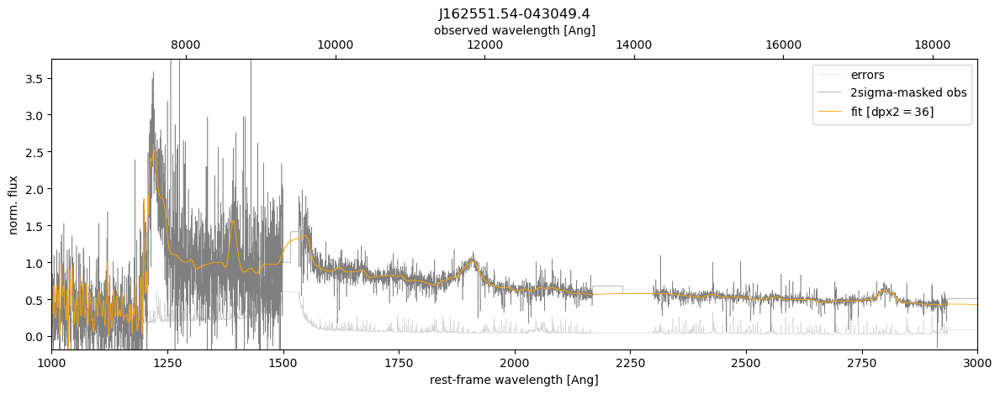

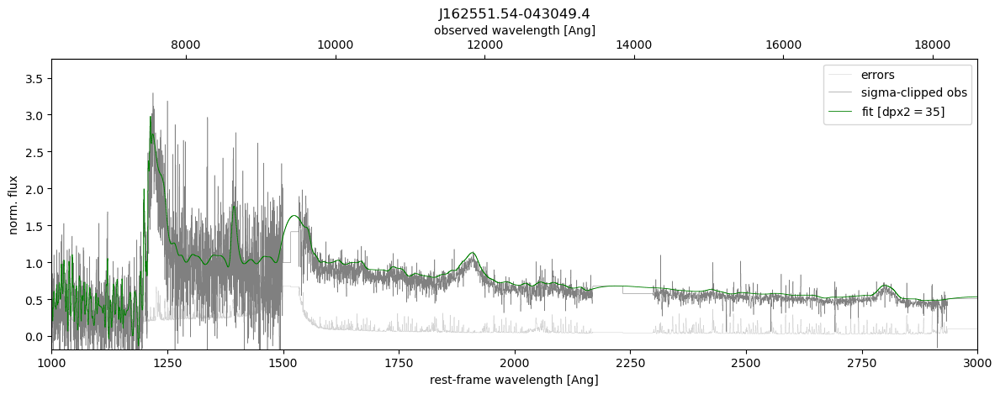

J194124-450023
success


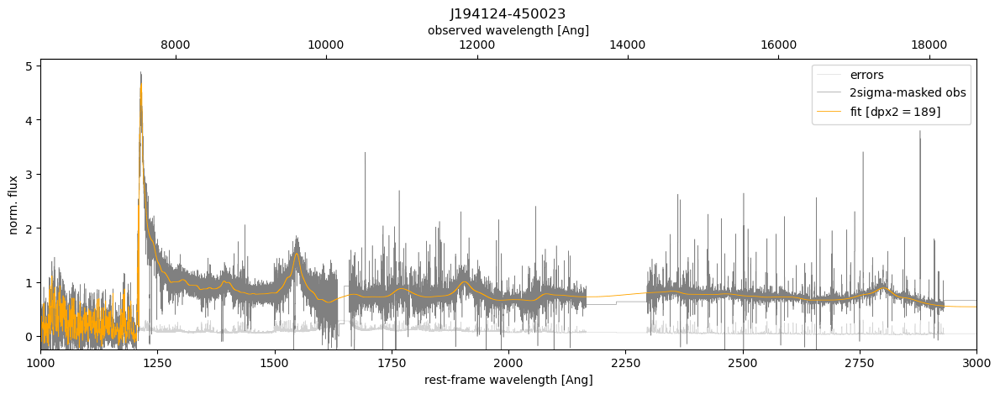

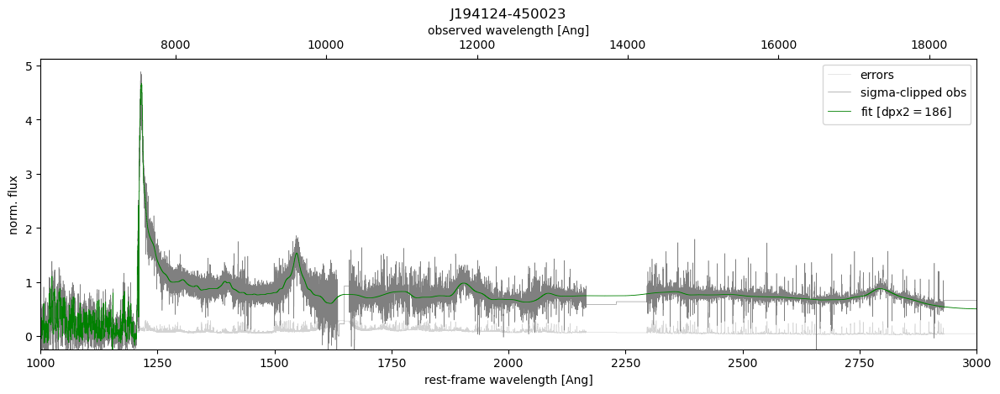

SDSS J074749.18+115352.4
success


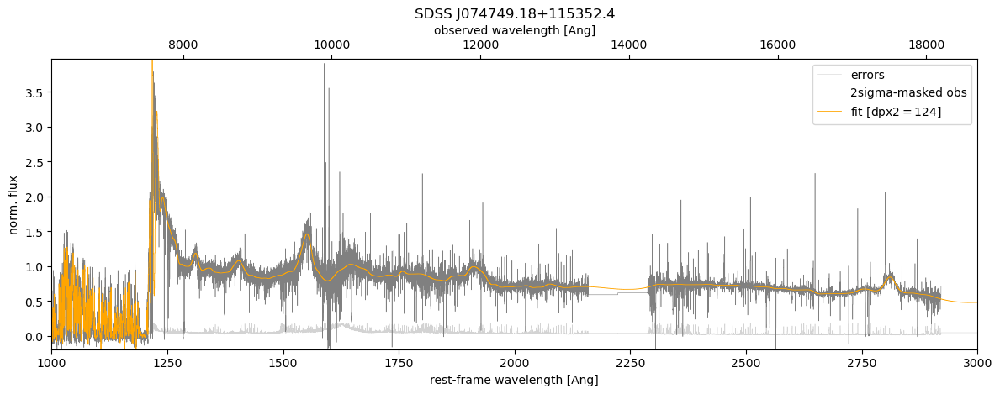

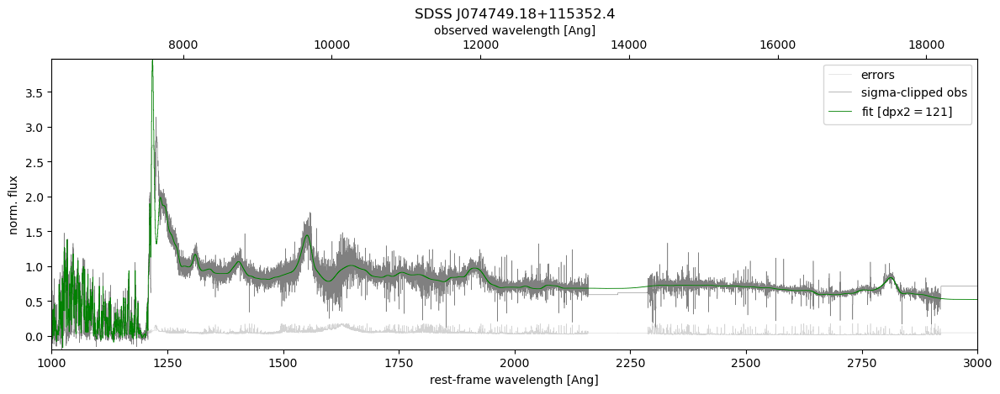

SDSS J222514.38+033012.5
success


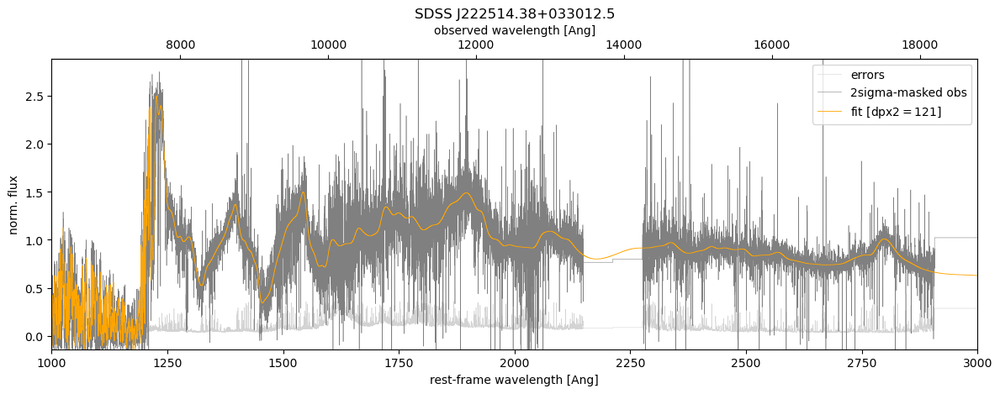

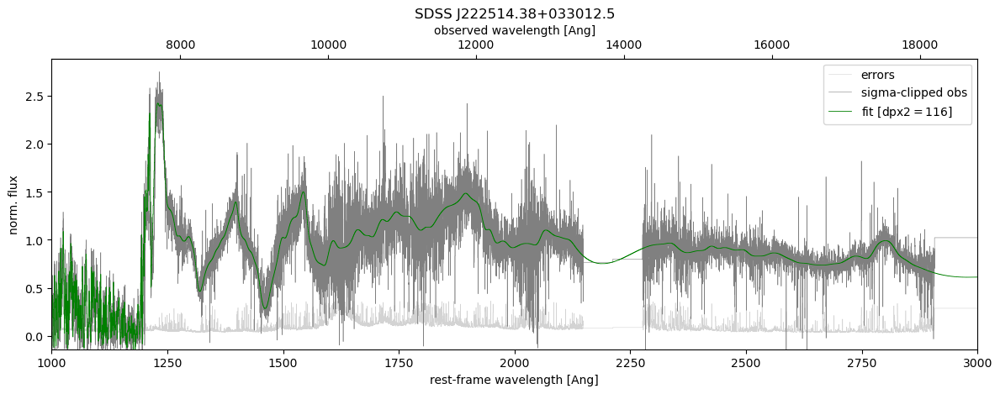

SDSS J220226.77+150952.3
success


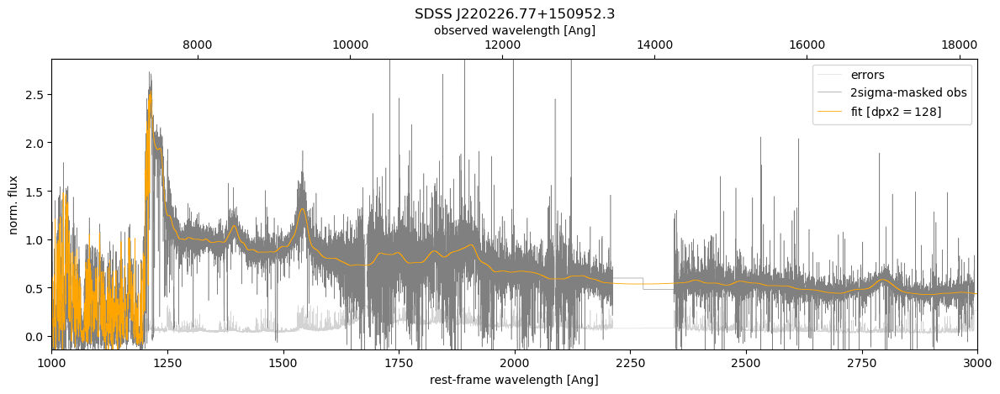

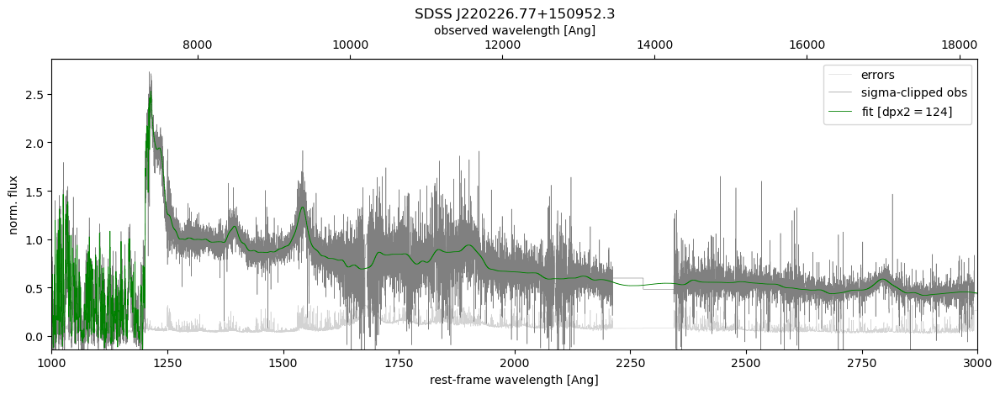

J222612-061807
success


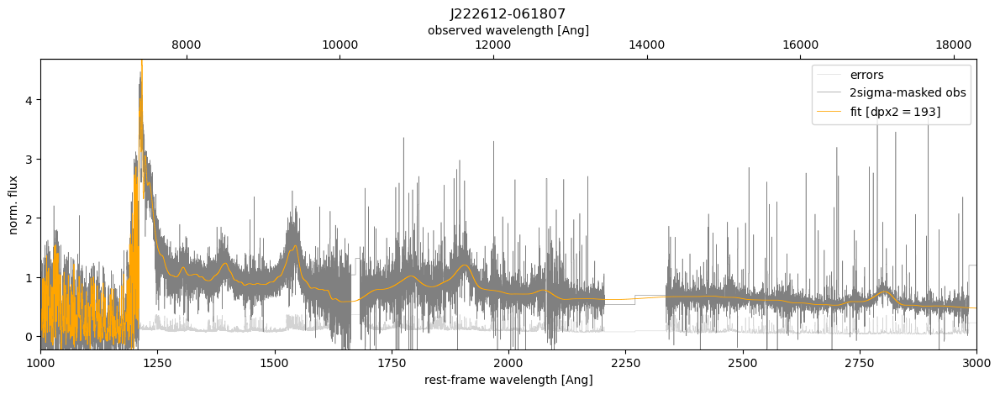

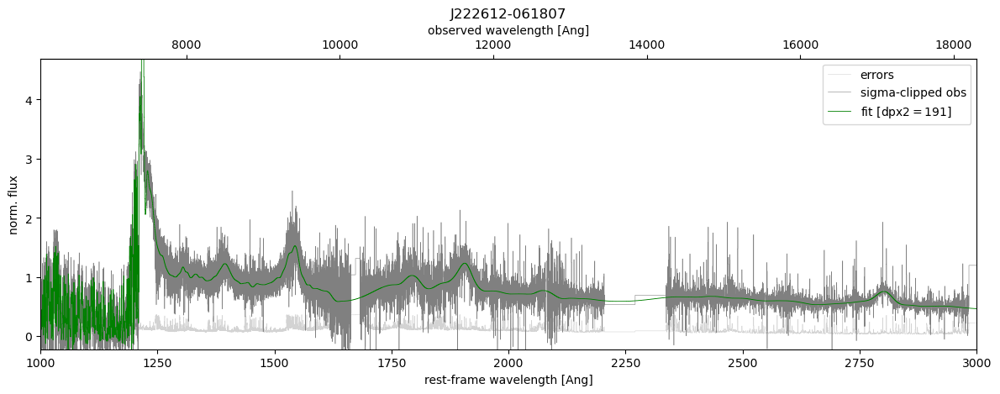

J140802-275820
success


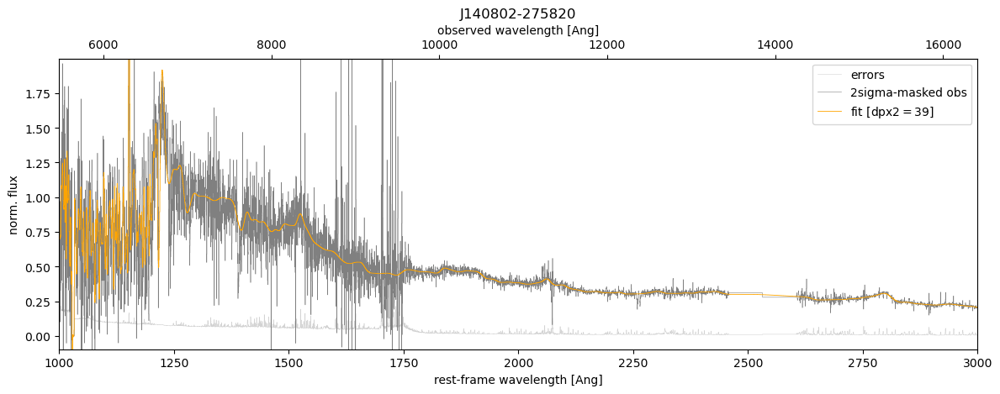

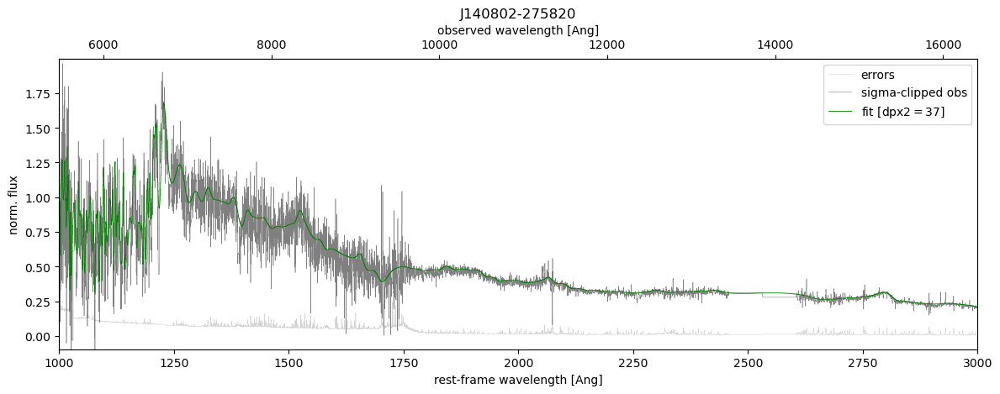

J040915-275633
success


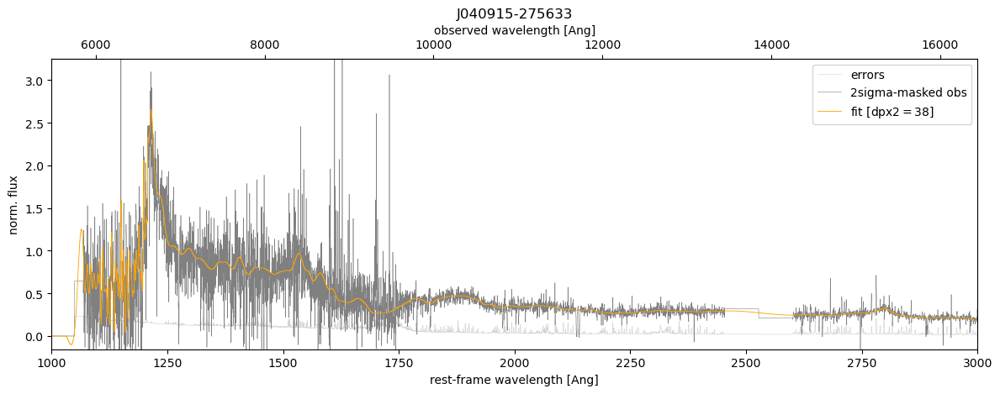

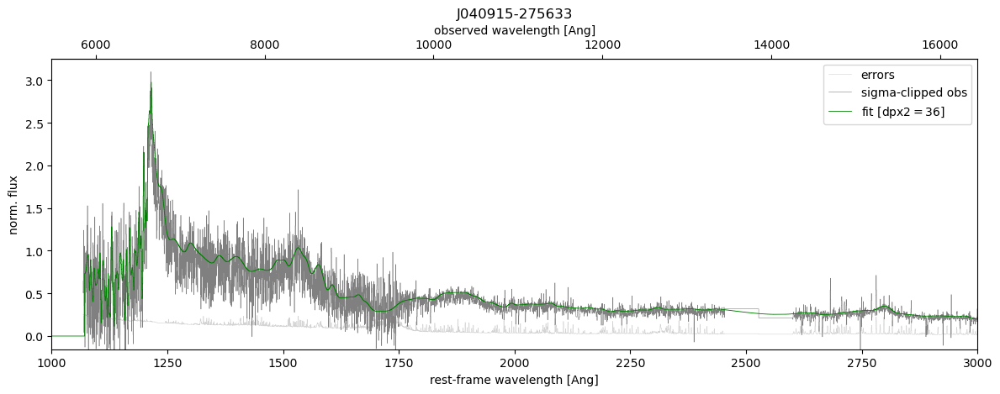

In [9]:
stlist = glob.glob(ST + '*.txt')

qmeta = np.loadtxt('/media/bartosz/USB STICK/samlaihei XQz5 main Spectral_Data/XQz5_meta.txt',delimiter = '\t',dtype='str')
qlist= qmeta[:,0] 

for i,q in enumerate(qlist):
        
    print(q)
    qfile = ST + q + '_stitched.txt'
    data = np.loadtxt(qfile,dtype='float')
    wl,flux,sig = data[:,0],data[:,1],data[:,2]
    z_in = float(qmeta[i][1])

    bin_size = 3
    wl_rebin,flux_rebin,sig_rebin=[],[],[]
    j = 0
    while j <= len(wl)-bin_size:
        wl_rebin.append(np.mean(wl[j:j+bin_size]))
        flux_rebin.append(np.mean(flux[j:j+bin_size]))
        sig_rebin.append(np.sqrt(np.sum([k**2 for k in sig[j:j+bin_size]]))/3)
        j+=bin_size
    
    # fig,ax = plt.subplots()
    # fig.set_figwidth(12)
    # ax.plot(wl_rebin,sig_rebin,drawstyle='steps-mid',lw=0.4,c='grey',alpha=0.5)
    # ax.plot(wl_rebin,flux_rebin,drawstyle='steps-mid',lw=0.4,c='grey',alpha=1)
    # #ax.set_ylim(-2*10**(-16),0.6*10**(-15))
    # ax.set_ylim(-0.2,3)
    # ax.set_xlim(5000,18000)
    # plt.show()


##### masking of entries with error > 2sig, and 2nd fit #####
    w1l = 13450     # water absorption observed WL
    w1r = 14250
    w2l = 18200
    w2r = 19400
    
    # mask both water absorption ranges
    mask1 = np.logical_or(wl<w1l,wl>w1r)
    mask2 = np.logical_or(wl<w2l,wl>w2r)
    mask3 = np.logical_and(mask1,mask2)
    wl = wl[mask3]
    flux = flux[mask3]
    sig = sig[mask3]

    # stddev and mean of errors
    err_threshold = 1                 # add error threshold to mask values with very large systematic errors
    sig_std = np.std(sig[sig<err_threshold])
    sig_mean = np.mean(sig[sig<err_threshold])


    # mean of flux
    flux_median = np.median(flux[sig<err_threshold])
    
    # mask errors larger than 2 sigma and flux values close to zero
    mask = np.logical_and( sig <= sig_mean+2*sig_std, flux >= -flux_median )
    if q == 'J072012-675632':
        mask = np.logical_and( sig <= sig_mean+3*sig_std, flux >= -flux_median )
    
    # Apply mask to wavelength and flux arrays
    masked_wl = wl[mask]
    masked_flux = flux[mask]
    masked_sig = sig[mask]    
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))])      # used to calculate the ratio 

    
    # apply 2nd fit to masked spectra
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
        fit2 = spec_fit
        fval2 = mode(masked_flux/spec_norm[1])[0]
        
    except Exception as error:             # error most likely due to the signal magnitude being much larger than error threshold set before
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        err_threshold = 5*10**(0)         # decrease error threshold and re-do masking
        sig_std = np.std(sig[sig<err_threshold])
        sig_mean = np.mean(sig[sig<err_threshold])
        mask = sig <= sig_mean+2*sig_std
        masked_wl = wl[mask]
        masked_flux = flux[mask]
        masked_sig = sig[mask]
        npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))]) 
        #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

        try:
            spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
            fit2 = spec_fit
            fval2 = mode(masked_flux/spec_norm[1])[0]
            
        except Exception as error:
            err = type(error).__name__
            print('2nd fit was not possible:', err) 
            print(masked_wl)
            continue
    
    spec_norm2 = spec_norm
    sigma_norm2 = sigma_norm
    print('success')

    # define plot range
    lya = 1215.67
    lya_range = np.logical_and(spec_norm[0]>lya-30, spec_norm[0]<lya+30)
    try:
        lya_max = np.max(spec_norm[1][lya_range])
    except Exception as error:
        err = type(error).__name__
        print(error)
        print(spec_norm)
        lya_max = spec_norm[1][0]
        
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,lya_max*1.05)
    xlimit = (1000,3000)
    
    # plot masked spectrum and fit
    fig2 = plt.figure()
    ax2 = fig2.subplots()
    fig2.set_figwidth(12)
    ax2.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax2.plot(spec_norm[0],spec_norm[1],linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='2sigma-masked obs')
    ax2.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    #ax.set_ylim(-2*10**(-16),0.6*10**(-15))
    #ax2.set_ylim(-1,5)
    #ax2.set_xlim(5000,18000)
    ax2.set_xlim(xlimit)
    ax2.set_ylim(ylimit)
    ax2.set_xlabel('rest-frame wavelength [Ang]')
    ax2.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(q)

    sax2 = ax2.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax2.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    #pp.savefig(fig2)
    plt.show()
    plt.close()
    

##### sigma clipping ####

    fval = np.mean(masked_flux/spec_norm2[1])
    
    #fit_interp = np.array([np.interp(k,spec_fit[0],spec_fit[1]) for k in spec_norm2[0]])
    diff = [abs(np.interp(spec_norm[0][k],spec_fit[0],spec_fit[1])-spec_norm[1][k]) for k in range(len(spec_norm[0]))]
    mask4 = [diff[k]<4*sigma_norm[k] for k in range(len(spec_norm[0]))]
    masked2_wl = masked_wl[mask4]
    masked2_flux = masked_flux[mask4]
    masked2_sig = masked_sig[mask4]

    # pseudo_flux = np.zeros(len(fit_interp))
    # pseudo_flux[mask4] = masked_flux[mask4]
    # pseudo_flux[np.logical_not(mask4)] = fit_interp[np.logical_not(mask4)]*fval
    # print(len(spec_norm2[0]),len(pseudo_flux))

    # update deltapix after masking
    npix_highz = len(masked2_wl[np.logical_and(masked2_wl>1250*(1+z_in),masked2_wl<2250*(1+z_in))])     
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)       
    
    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked2_wl,masked2_flux,masked2_sig,z_in,deltapix2)
        fit3 = spec_fit
        fval3 = mode(masked2_flux/spec_norm[1])[0]

        #pseudo_fit, _ , _ = spline_fit(spec_norm2[0]*(1+z_in),pseudo_flux,sigma_norm2,z_in,deltapix2)
    except Exception as error:
        err = type(error).__name__
        print('sigma clipping not possible:', err) 
        continue

    
    # # save fit + normalised spectrum
    # norm_save='{}_norm'.format(qname)
    # with open(hnpath + norm_save + '.txt','w') as nsave:
    #     for x in itertools.zip_longest(*spec_norm,sigma_norm):
    #         nsave.write('{} \t {} \t {}\n'.format(*x))
    # nsave.close()


    # fit_save='{}_dpx{}'.format(qname,deltapix2)
    # with open(hfpath + fit_save + '.txt','w') as fsave:
    #     for x in itertools.zip_longest(*spec_fit):
    #         fsave.write('{} \t {}\n'.format(*x))
    # fsave.close()
    
        
    # plot masked spectrum and fit
    fig3 = plt.figure(2)
    ax3 = fig3.subplots()
    fig3.set_figwidth(12)
    ax3.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax3.plot(spec_norm[0],spec_norm[1]*fval3/fval2,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='sigma-clipped obs')
    ax3.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    #ax3.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='pseudo fit')
    ax3.set_xlim(xlimit)
    ax3.set_ylim(ylimit)
    ax3.set_xlabel('rest-frame wavelength [Ang]')
    ax3.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(q)

    sax3 = ax3.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax3.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    #pp.savefig(fig3)
    plt.show()
    plt.close()

5